In [1]:
import numpy as np
from netCDF4 import Dataset
import matplotlib.pyplot as plt
from wrf import to_np, getvar, CoordPair, vertcross, latlon_coords,interpline, interplevel, get_cartopy,  xy_to_ll, ll_to_xy, smooth2d
import wrf
import matplotlib.patches as mpatches
import matplotlib.colors as mcolors
from matplotlib.cm import get_cmap
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.feature import NaturalEarthFeature
from scipy.interpolate import interp1d
import glob
import xarray as xr
from scipy.ndimage import gaussian_filter
from matplotlib.cm import get_cmap
from statistics import multimode, mode
from datetime import datetime
import os
from matplotlib.colors import TwoSlopeNorm
#Acceleration of gravity (constant) for converting to geopotential height
g = 9.8

In [2]:
# Dictionary with variable names as keys and directory paths as values
directories = {
    'thompson': "/scratch/sawyer/wwrf/2017-01-09/thompson/",
    'wsm6': "/scratch/sawyer/wwrf/2017-01-09/wsm6/",
    'p3': "/scratch/sawyer/wwrf/2017-01-09/p3_1-cat/",
    'p3mom': "/scratch/sawyer/wwrf/2017-01-09/p3_3mom/",
    'p3_2nd': "/scratch/sawyer/wwrf/2017-01-09/p3_2nd/",
    'p3_2xcloud': "/scratch/sawyer/wwrf/2017-01-09/p3_2x_cloud/",
    'ishamel': "/scratch/sawyer/wwrf/2017-01-09/ishmael/",
    'thopmson_aa': "/scratch/sawyer/wwrf/2017-01-09/thompson_aa_38/",
    'ntu': "/scratch/sawyer/wwrf/2017-01-09/ntu/",
    'wdm6': "/scratch/sawyer/wwrf/2017-01-09/wdm6/",
}

######## What domain are we processing? #################

domain = 'wrfout_d01'

# Define your date-time bounds
start_bound = datetime.strptime("2017-01-08 12:00", "%Y-%m-%d %H:%M")
end_bound = datetime.strptime("2017-01-08 12:00", "%Y-%m-%d %H:%M")

In [3]:
# If want to see cross section normal axis set plot_axis = True
plot_axis = True
# If want to see cross section transects set plot_cs = True
plot_cs = True

# If want to see cross section transects of latent heating; set plot_lh = True
plot_lh = True

# Set to False if only want to save first output time
saved_once = False
    
########### Define the colors in the desired sequence for IVT: ###########

colors = ['#FFFF00', '#FFEE00','#FFDC00', '#FFB700',
          '#FFA300', '#FF9000', '#FF7D00', '#FF6800',
          '#FF5200', '#C70039','#900C3F', (.88,.24,.69)]

############## Create a colormap using ListedColormap #################

cmap = mcolors.ListedColormap(colors)
pmsl_levels = np.arange(960, 1060, 4)
# dark brown for state/coastlines
dark_brown = (0.4, 0.2, 0)
ivt_levels = np.arange(250,1150,100)

In [4]:
# Function to plot a line at a specified angle and midpoint, modified to return endpoints
def get_axis_coords(midpoint, length, angle_degrees):
    x_mid, y_mid = midpoint
    angle_radians = np.radians(angle_degrees)

    # Calculate delta x and delta y based on the angle
    delta_x = (length / 2) * np.cos(angle_radians)
    delta_y = (length / 2) * np.sin(angle_radians)

    # Calculate the endpoints
    x1, y1 = x_mid - delta_x, y_mid - delta_y
    x2, y2 = x_mid + delta_x, y_mid + delta_y

    return [x1, y1, x2, y2]

ensemble member:  thompson
/scratch/sawyer/wwrf/2017-01-09/thompson/wrfout_d01_2017-01-08_12:00:00


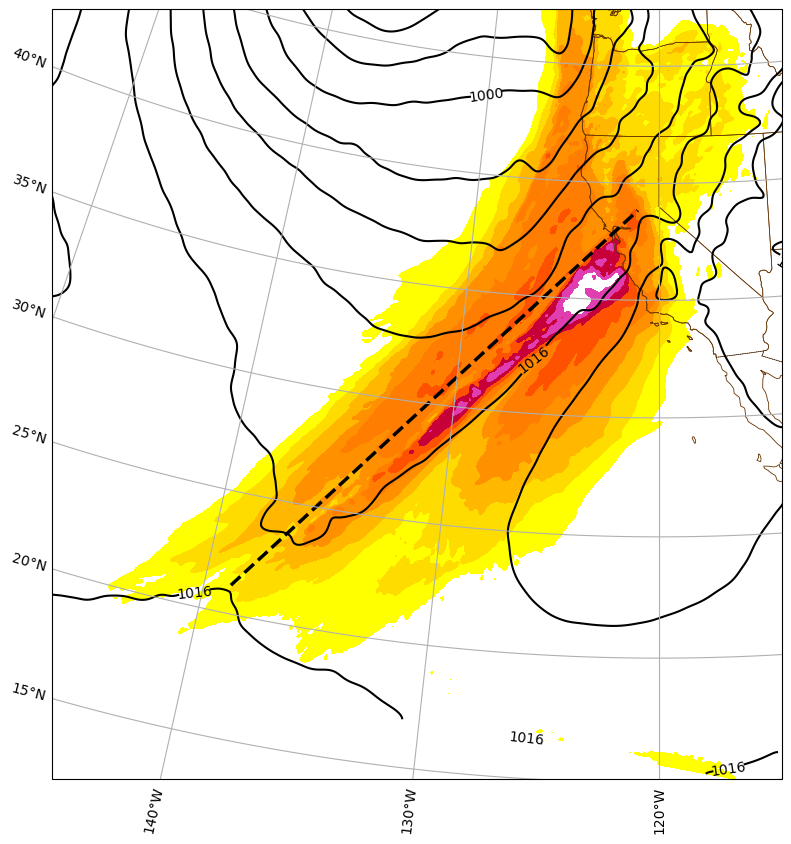

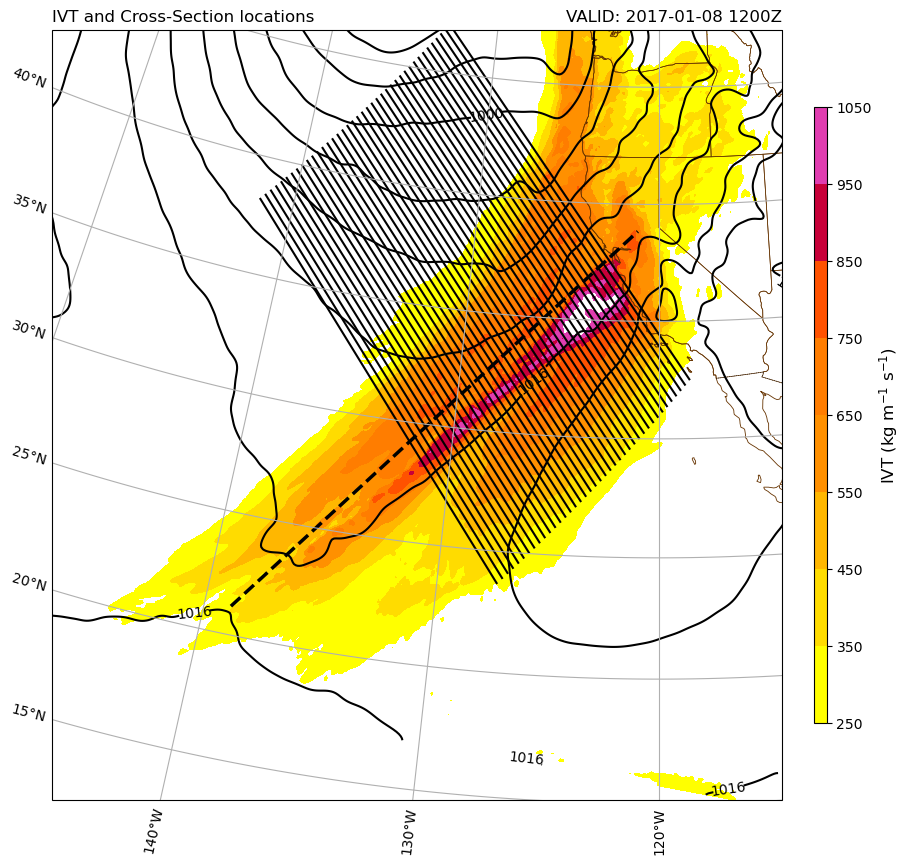

278.5133758544922


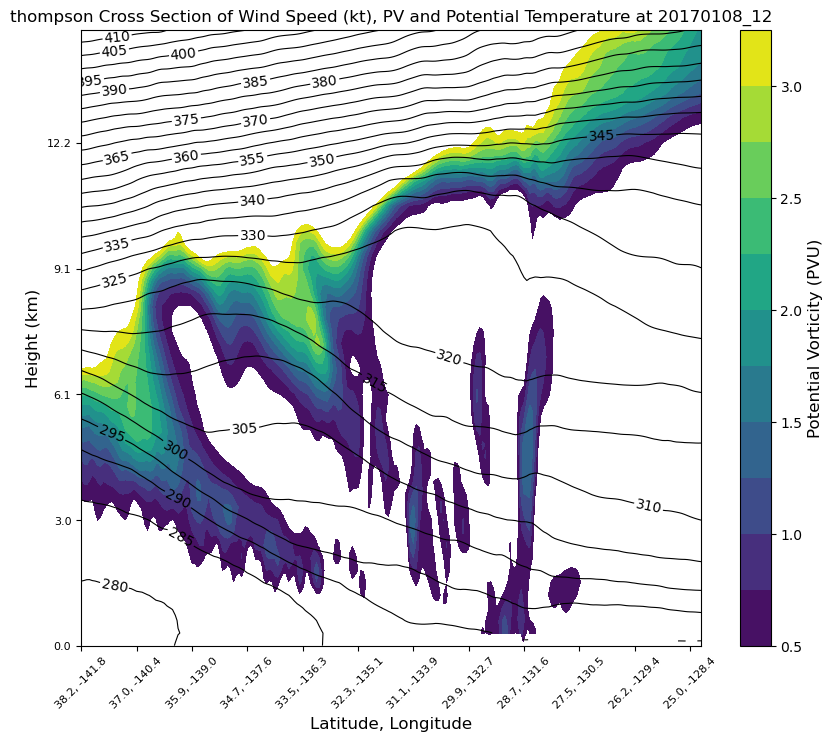

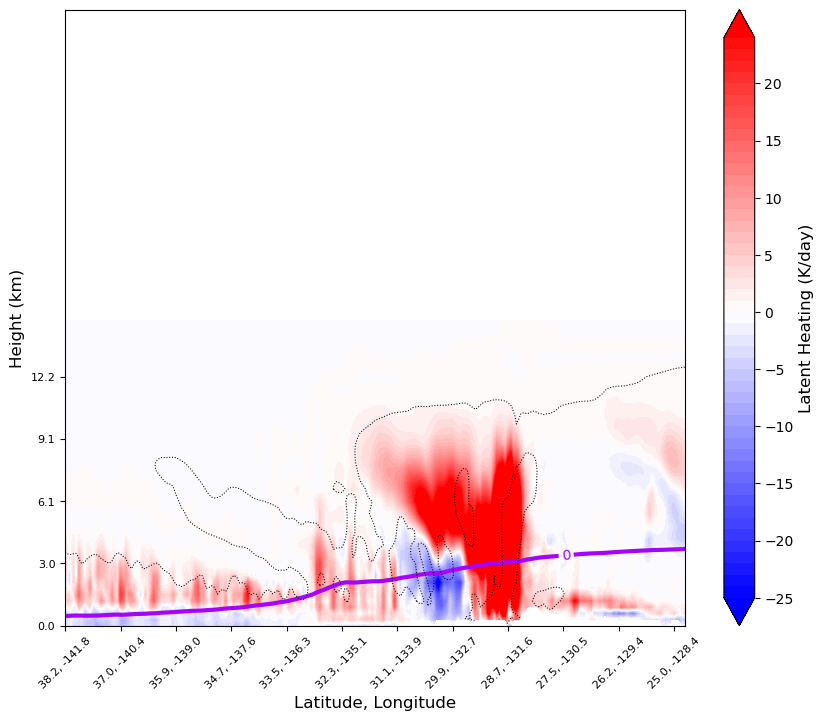

ensemble member:  wsm6
/scratch/sawyer/wwrf/2017-01-09/wsm6/wrfout_d01_2017-01-08_12:00:00


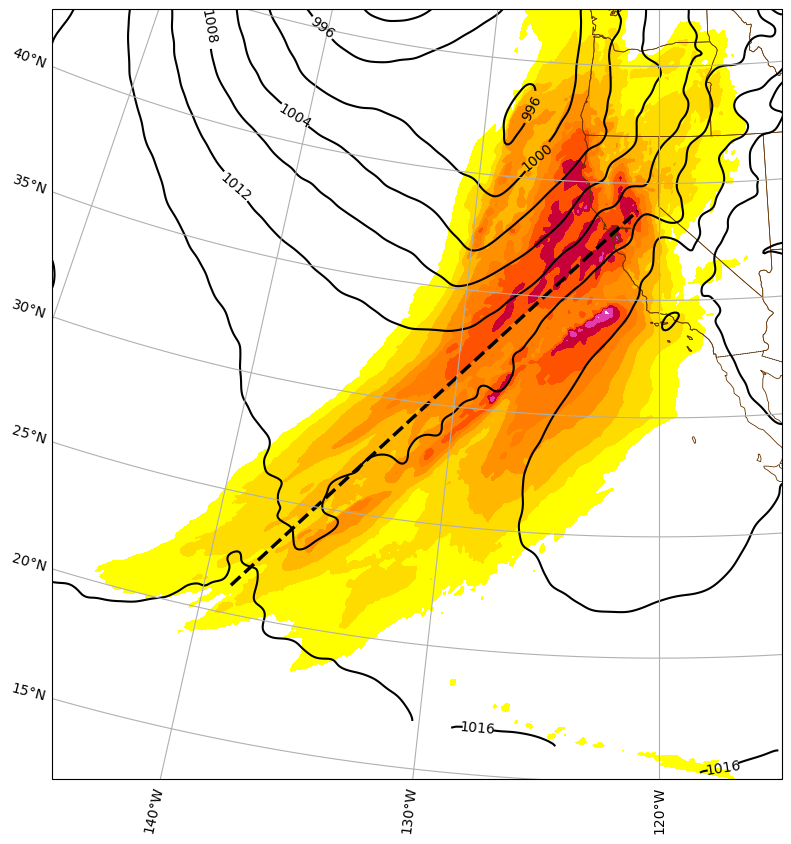

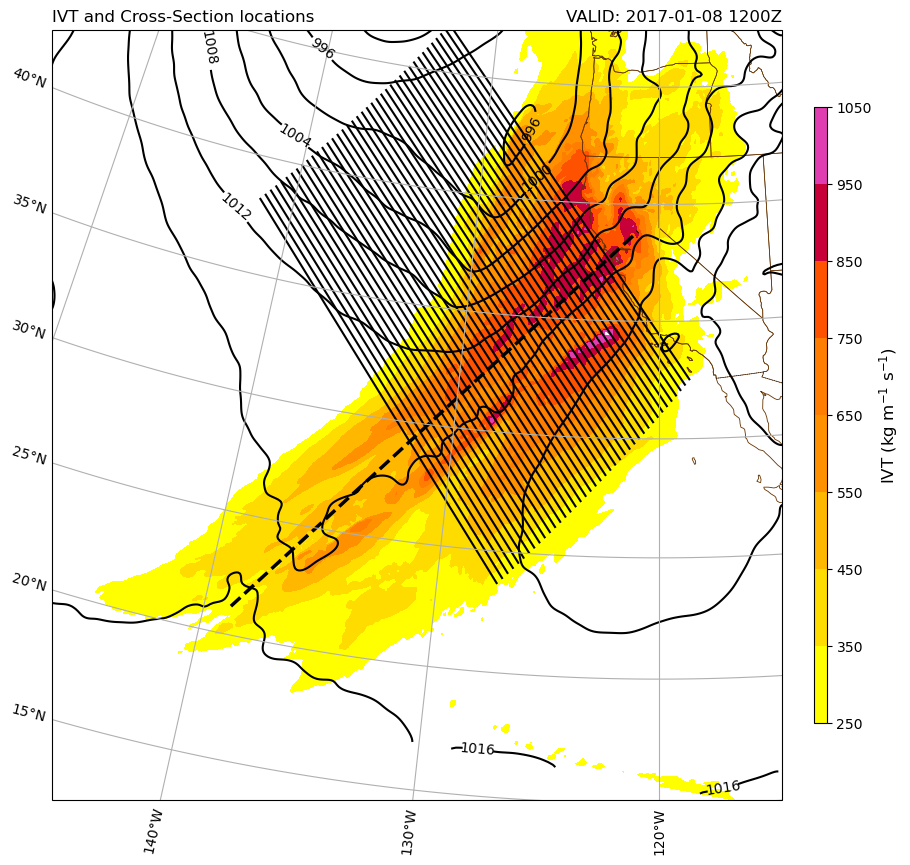

278.30069427490236


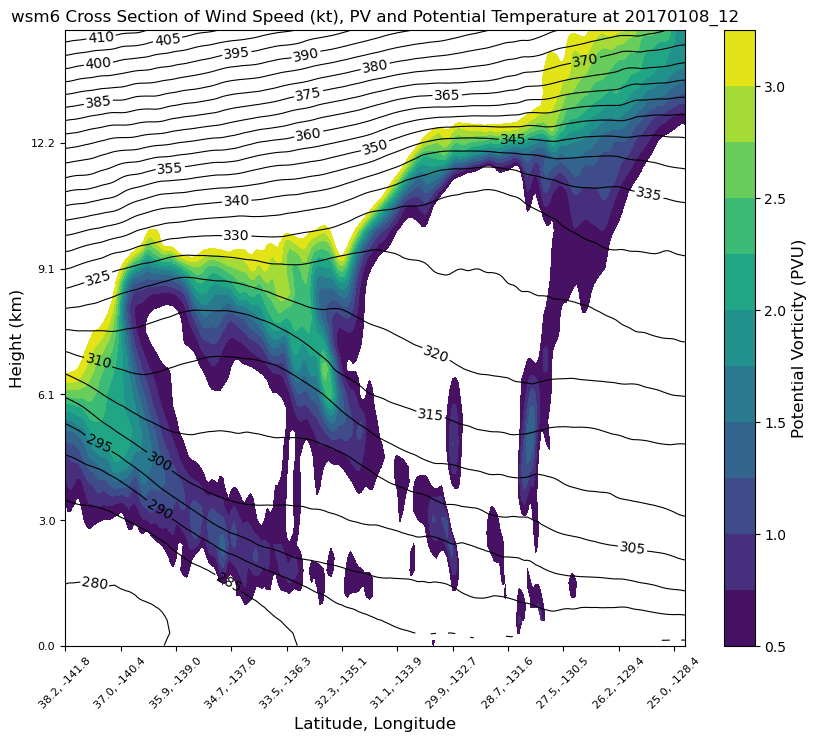

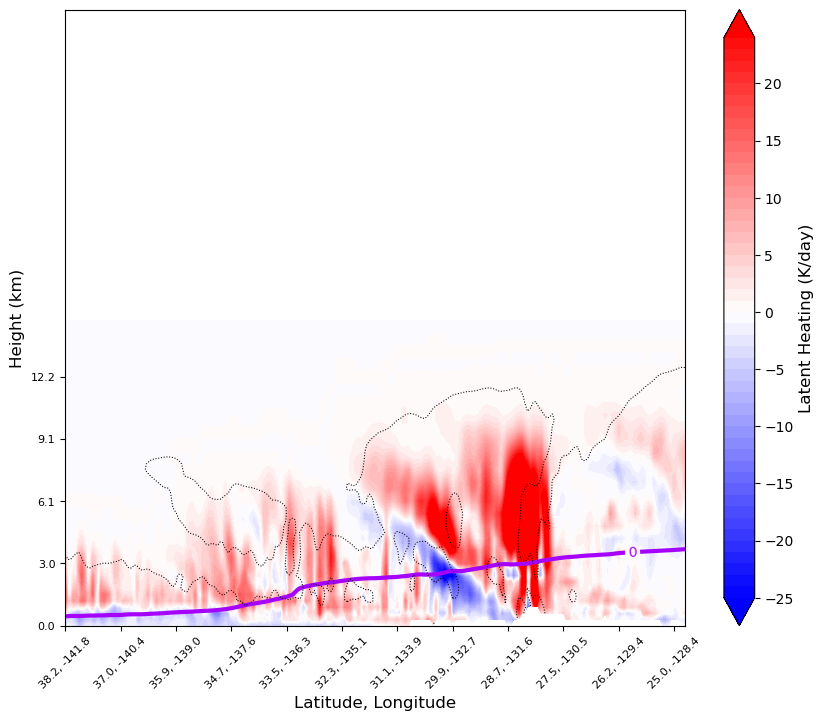

ensemble member:  p3
/scratch/sawyer/wwrf/2017-01-09/p3_1-cat/wrfout_d01_2017-01-08_12:00:00


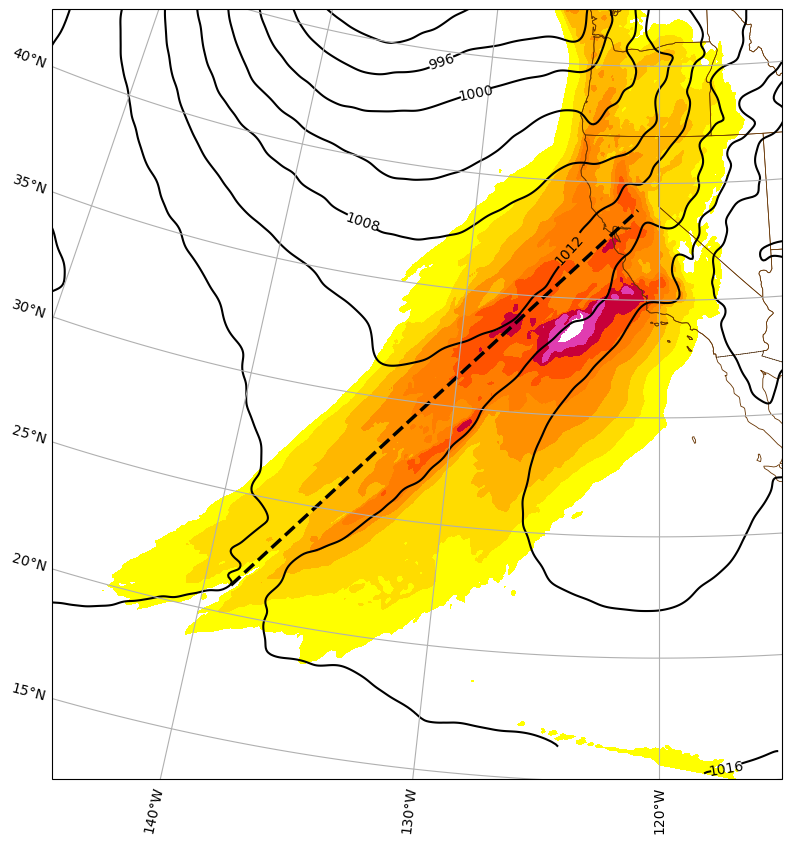

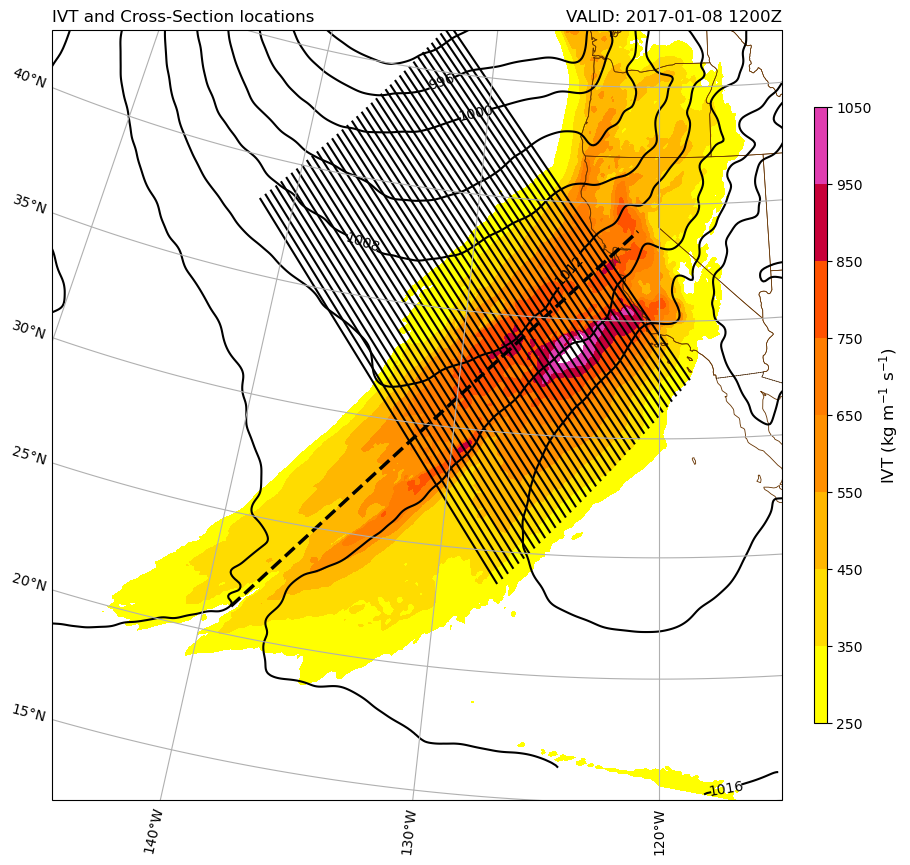

278.90249862670896


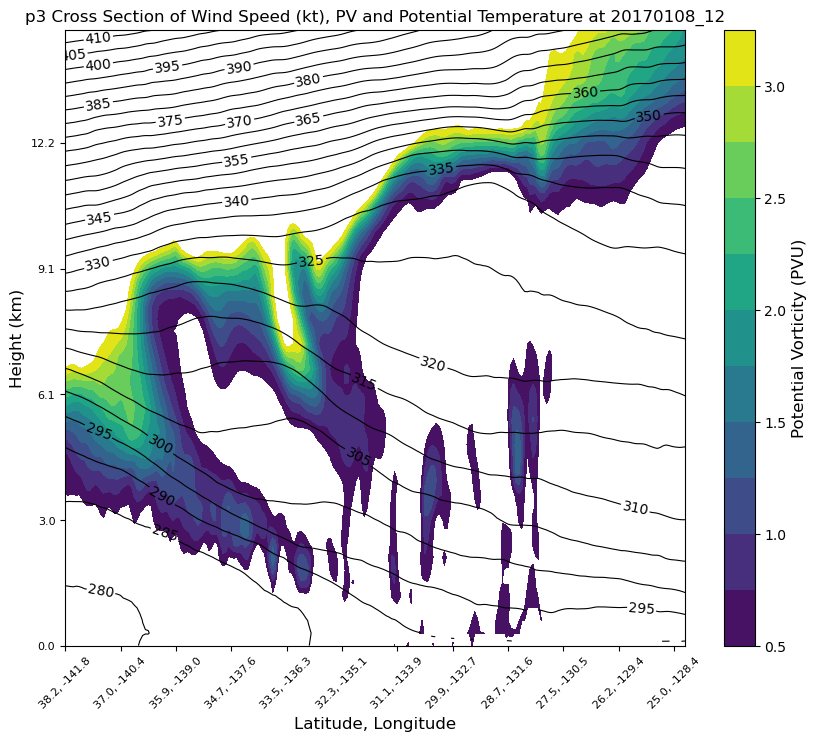

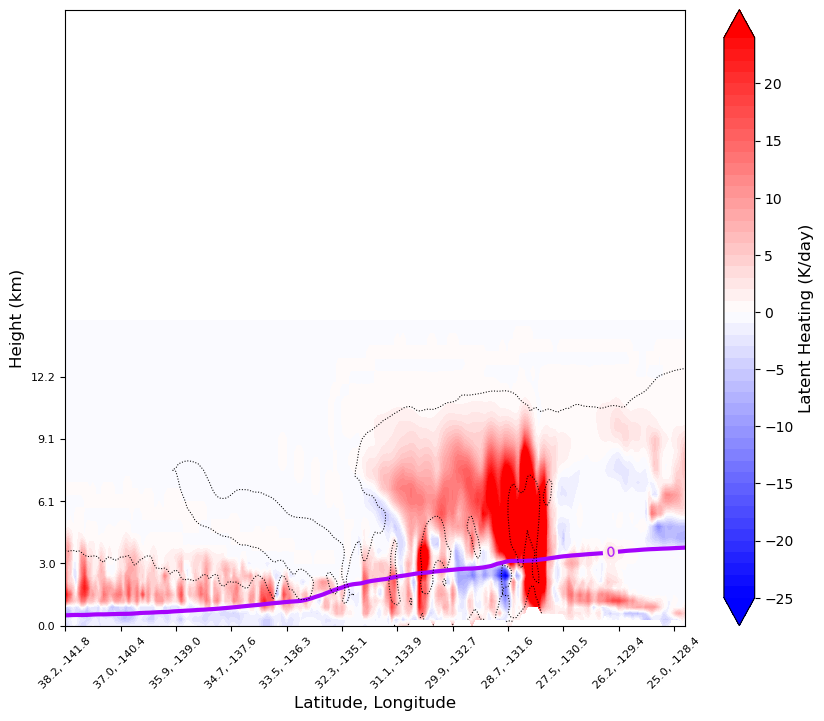

ensemble member:  p3mom
/scratch/sawyer/wwrf/2017-01-09/p3_3mom/wrfout_d01_2017-01-08_12:00:00


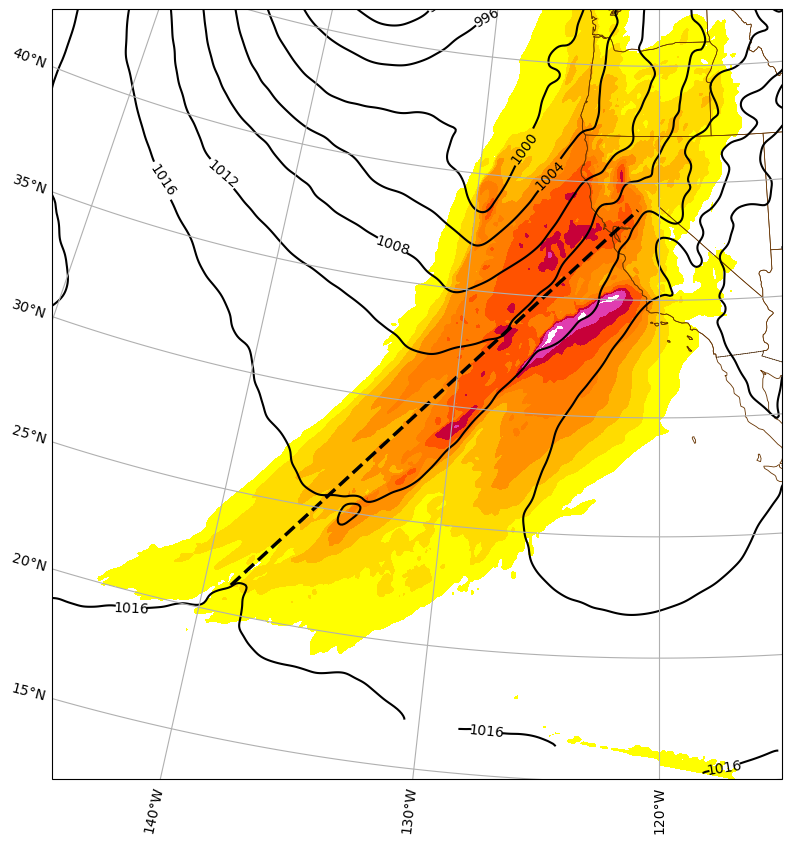

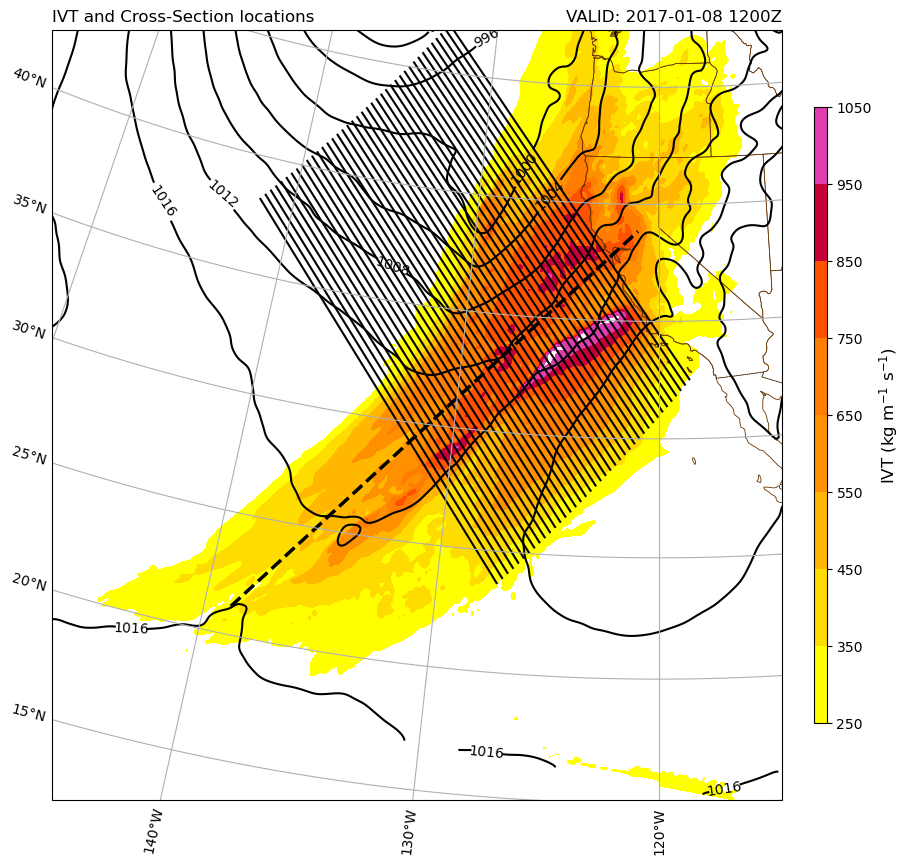

278.7254829406738


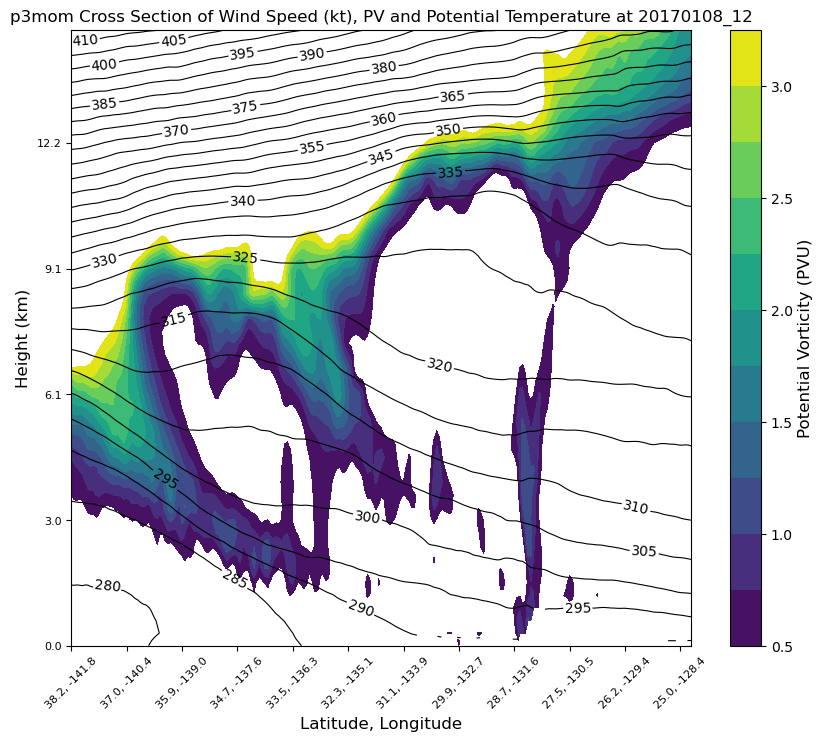

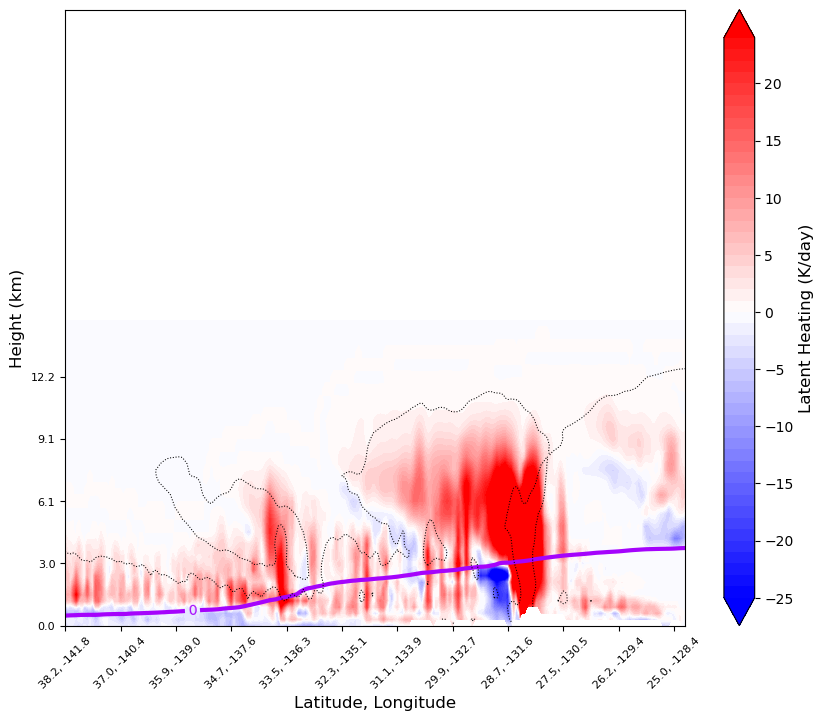

ensemble member:  p3_2nd
/scratch/sawyer/wwrf/2017-01-09/p3_2nd/wrfout_d01_2017-01-08_12:00:00


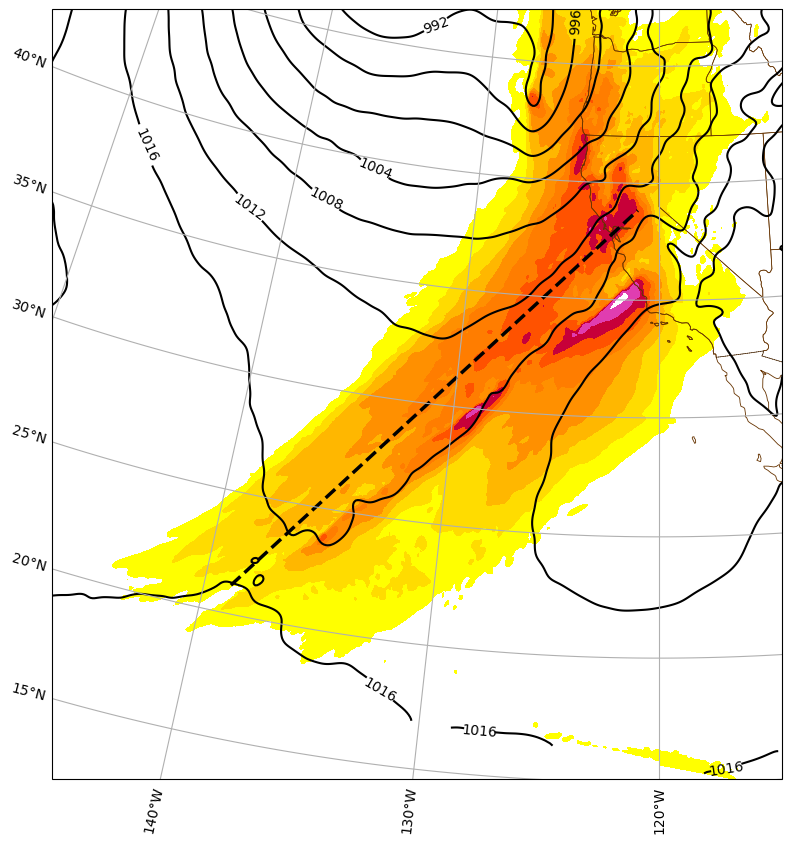

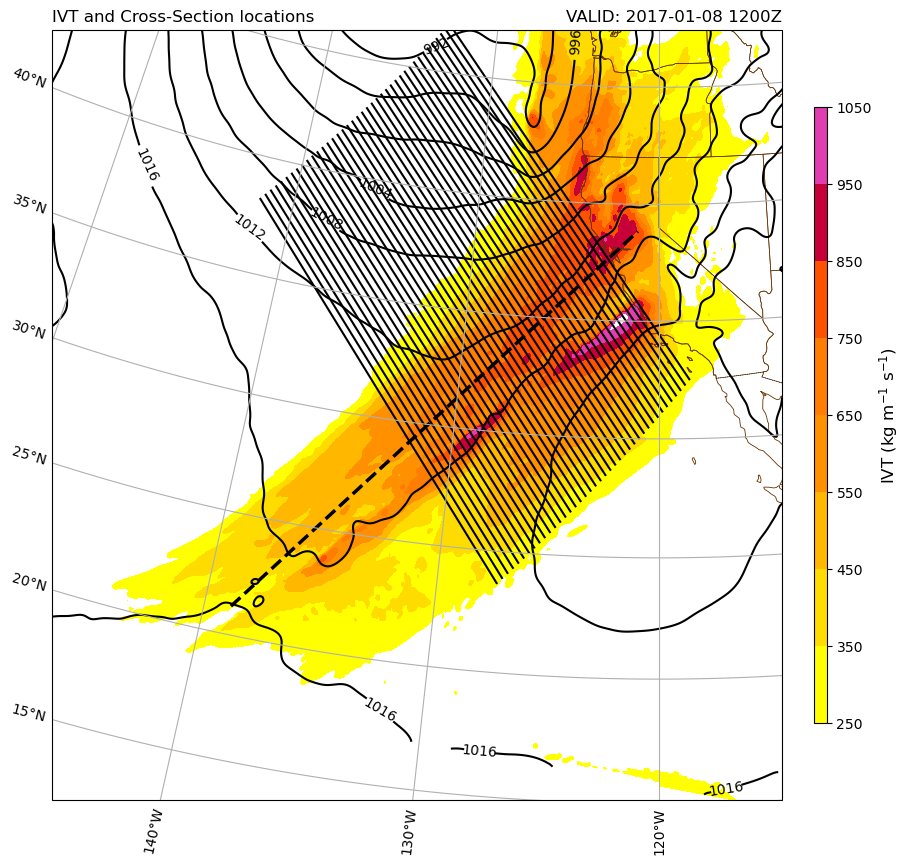

278.8233726501465


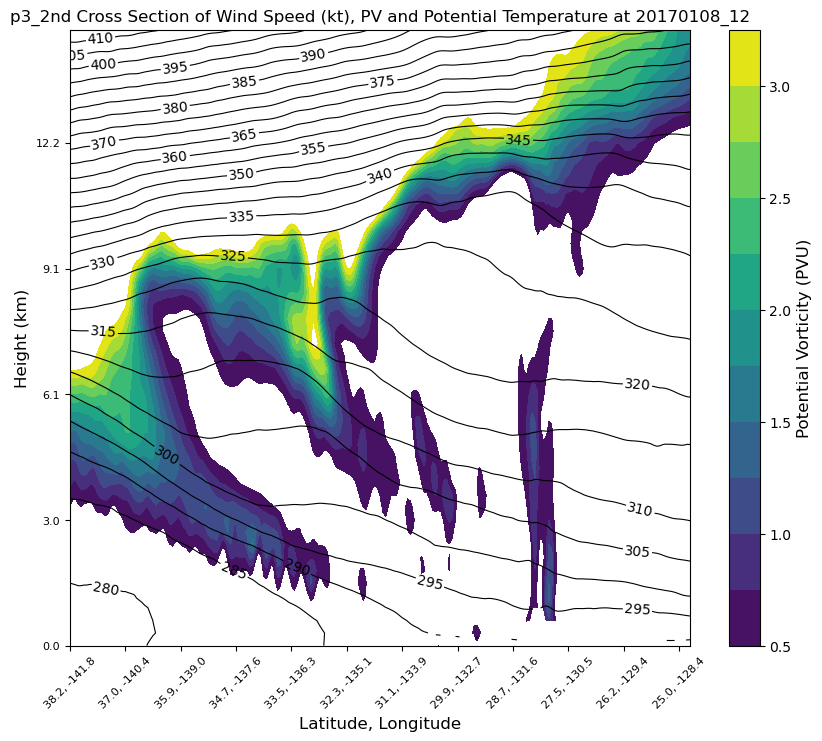

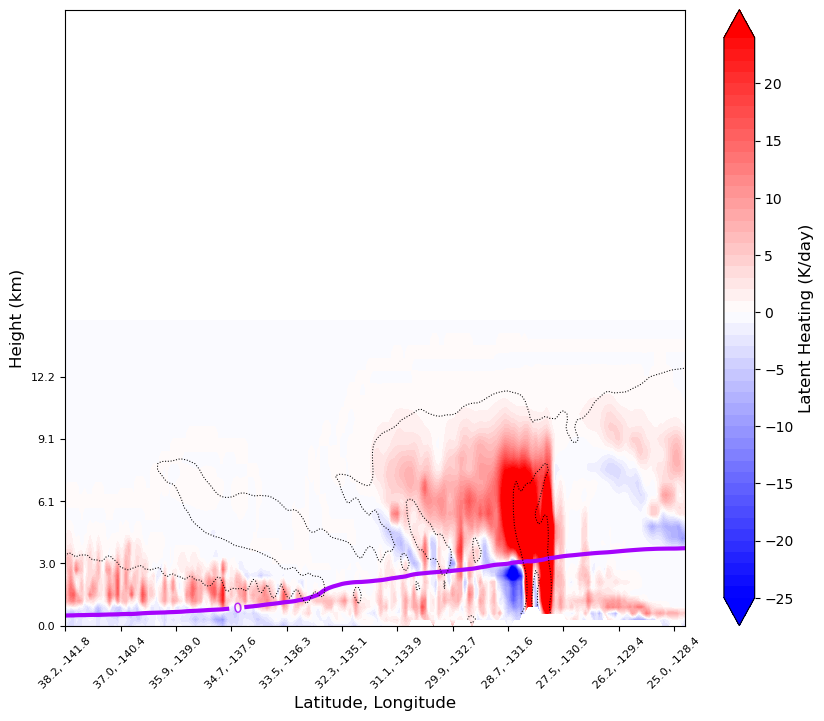

ensemble member:  p3_2xcloud
/scratch/sawyer/wwrf/2017-01-09/p3_2x_cloud/wrfout_d01_2017-01-08_12:00:00


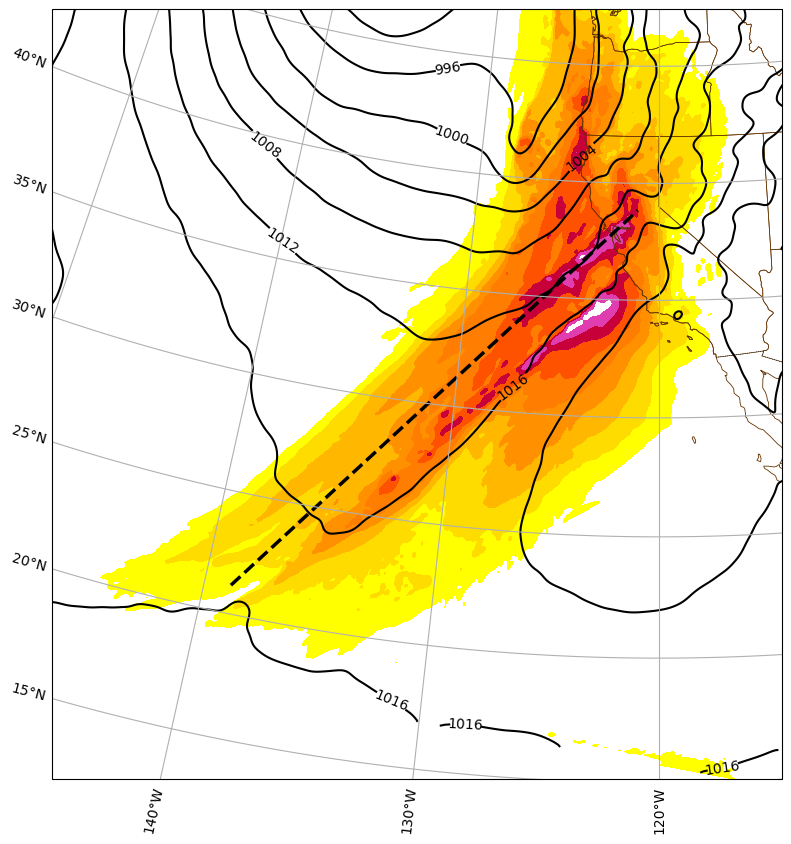

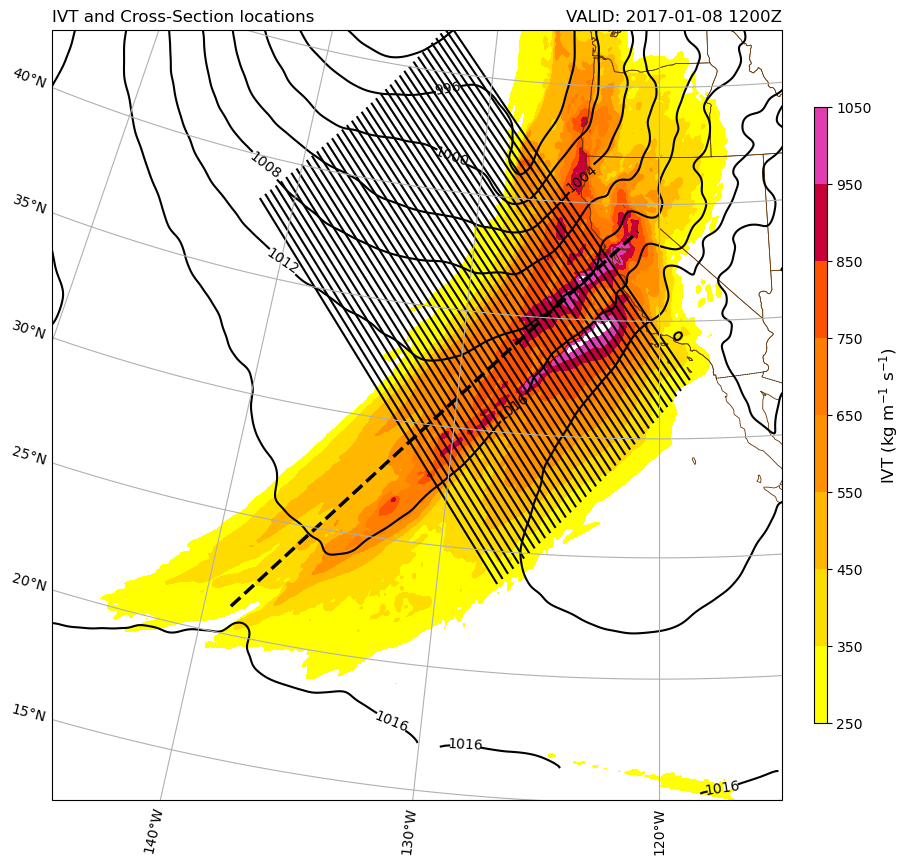

278.71592407226564


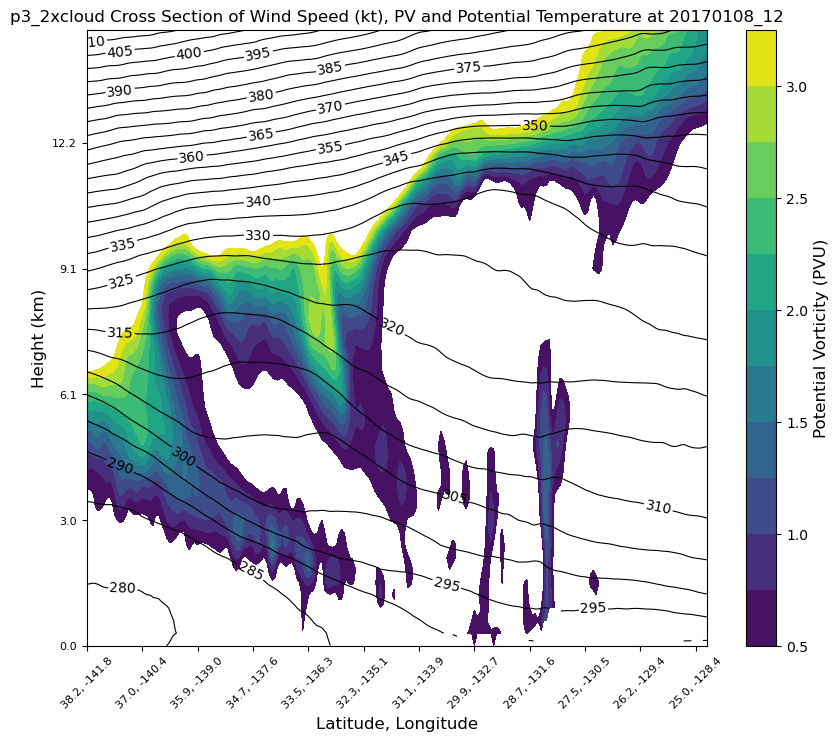

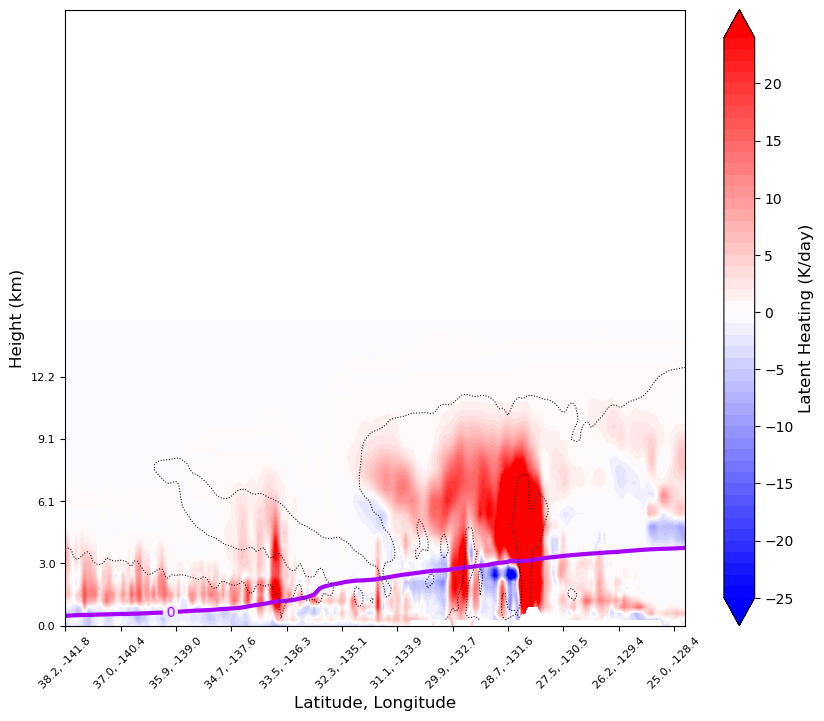

ensemble member:  ishamel
/scratch/sawyer/wwrf/2017-01-09/ishmael/wrfout_d01_2017-01-08_12:00:00


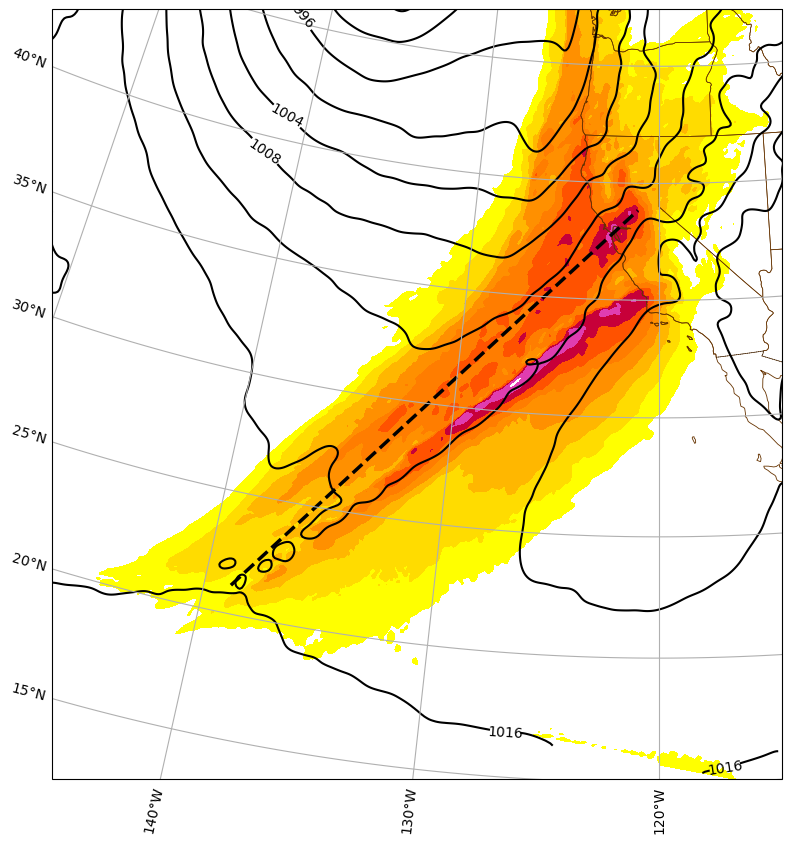

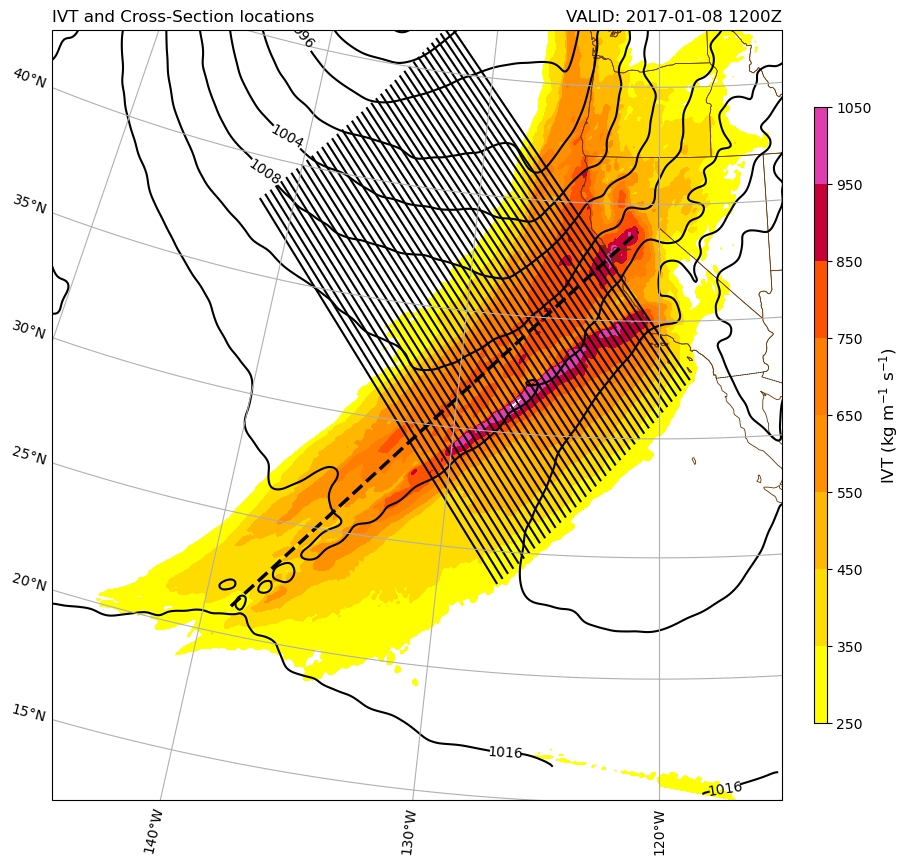

279.51177368164065


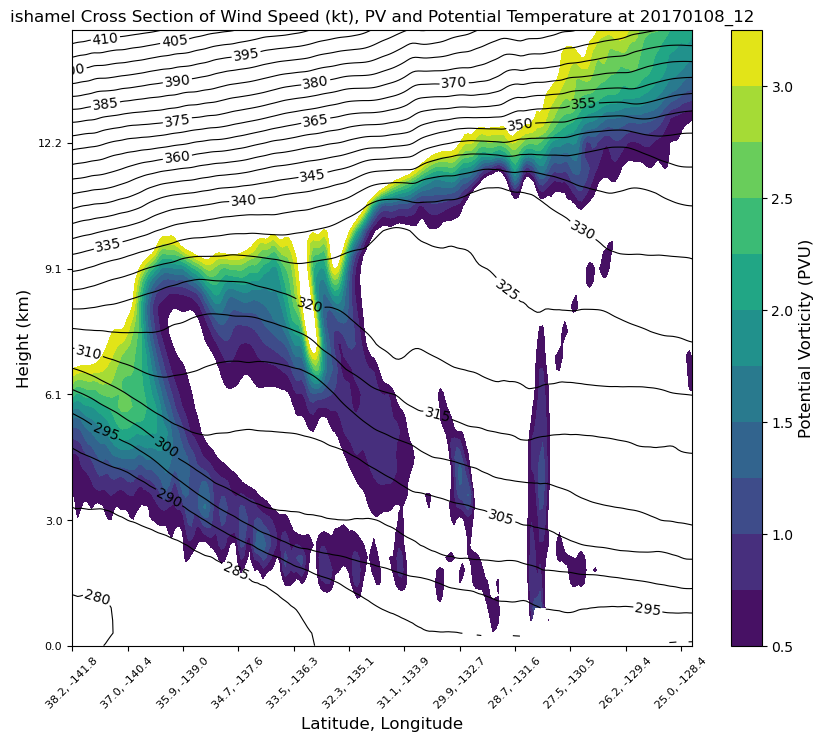

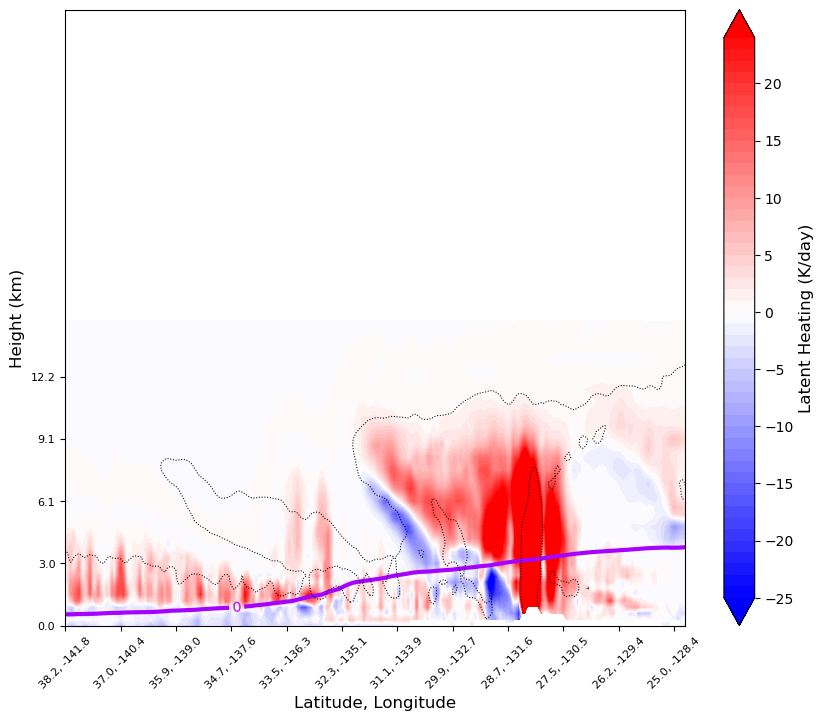

ensemble member:  thopmson_aa
/scratch/sawyer/wwrf/2017-01-09/thompson_aa_38/wrfout_d01_2017-01-08_12:00:00


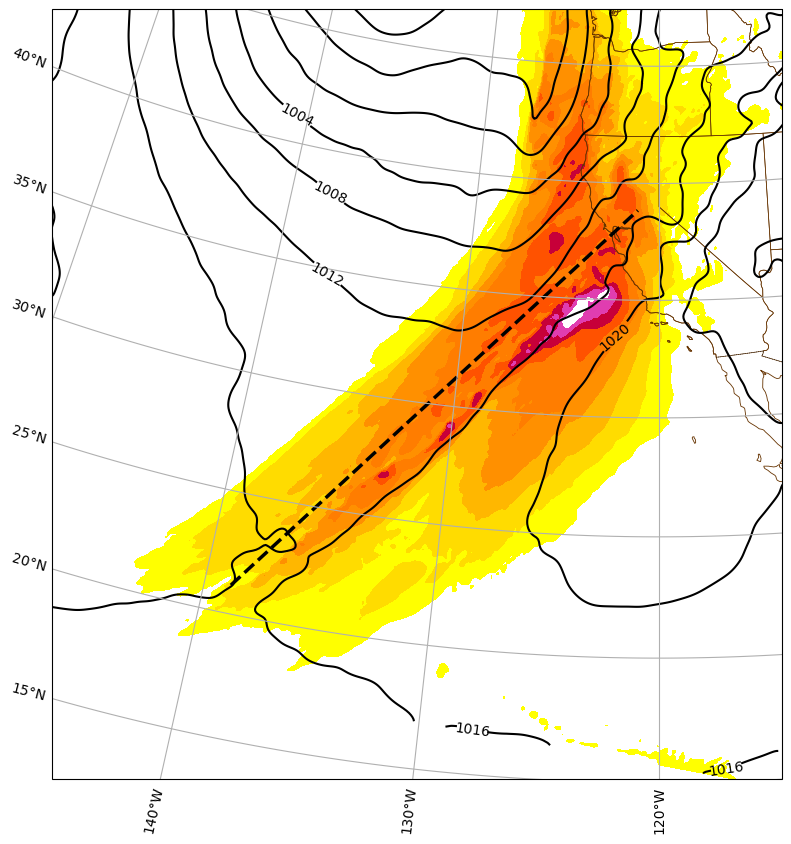

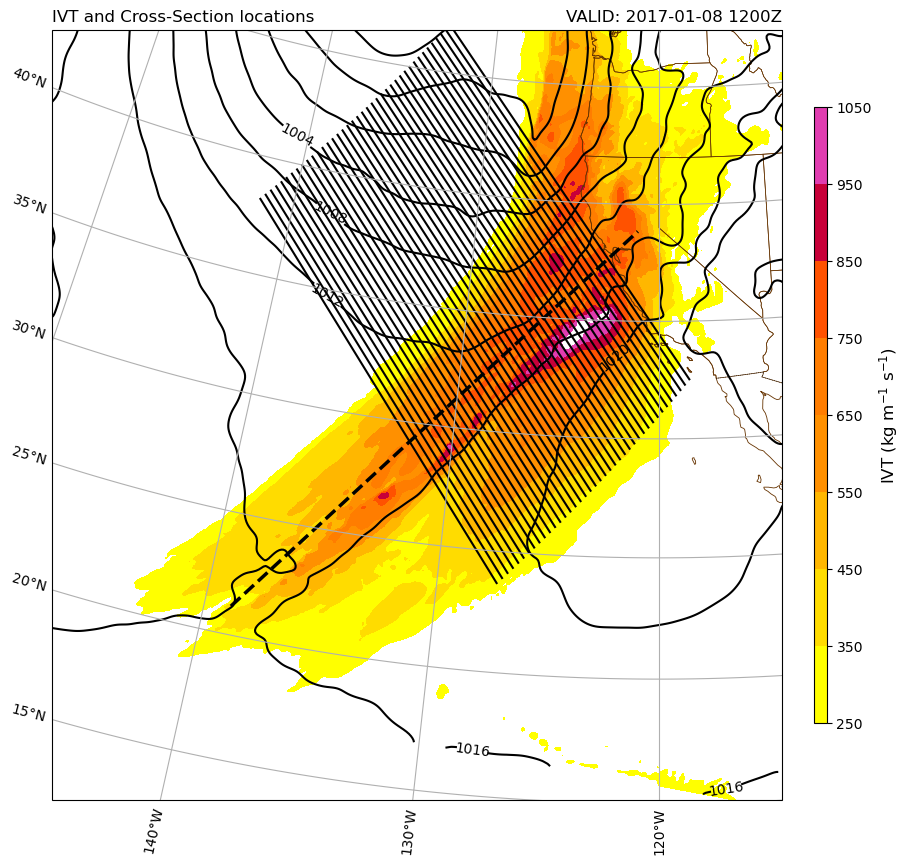

278.70870819091795


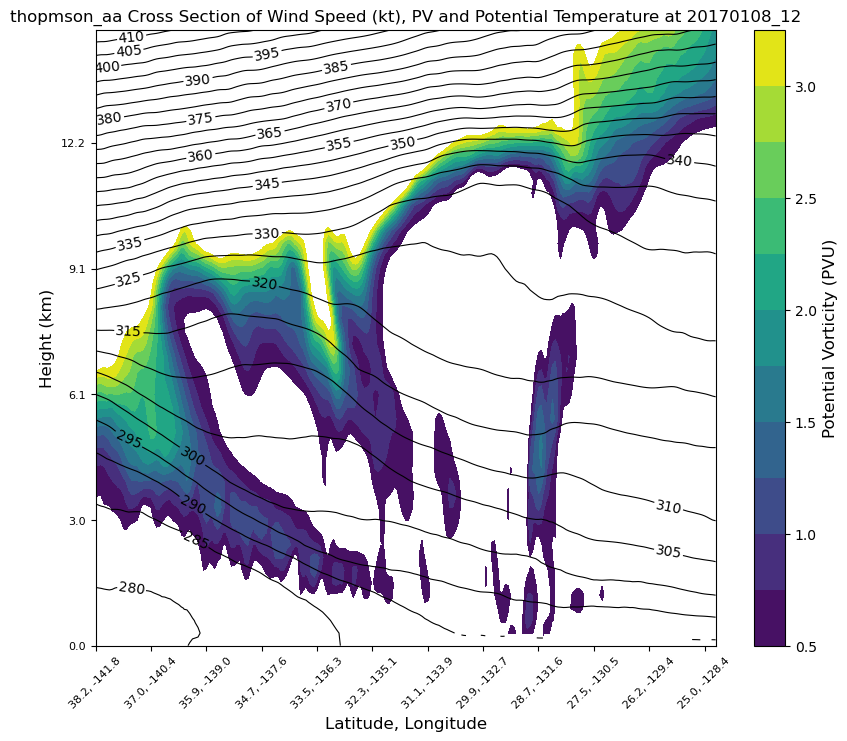

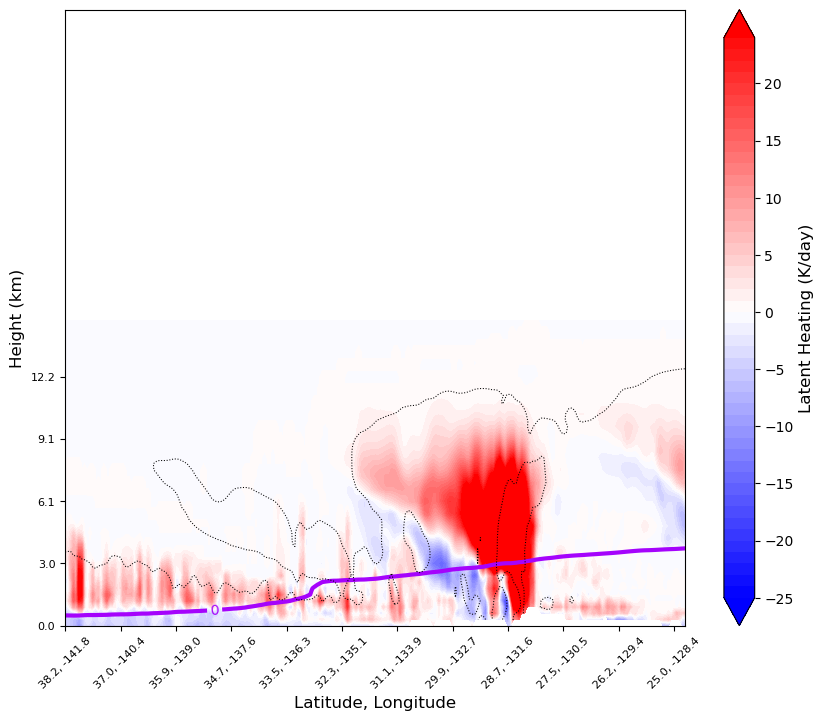

ensemble member:  ntu
/scratch/sawyer/wwrf/2017-01-09/ntu/wrfout_d01_2017-01-08_12:00:00


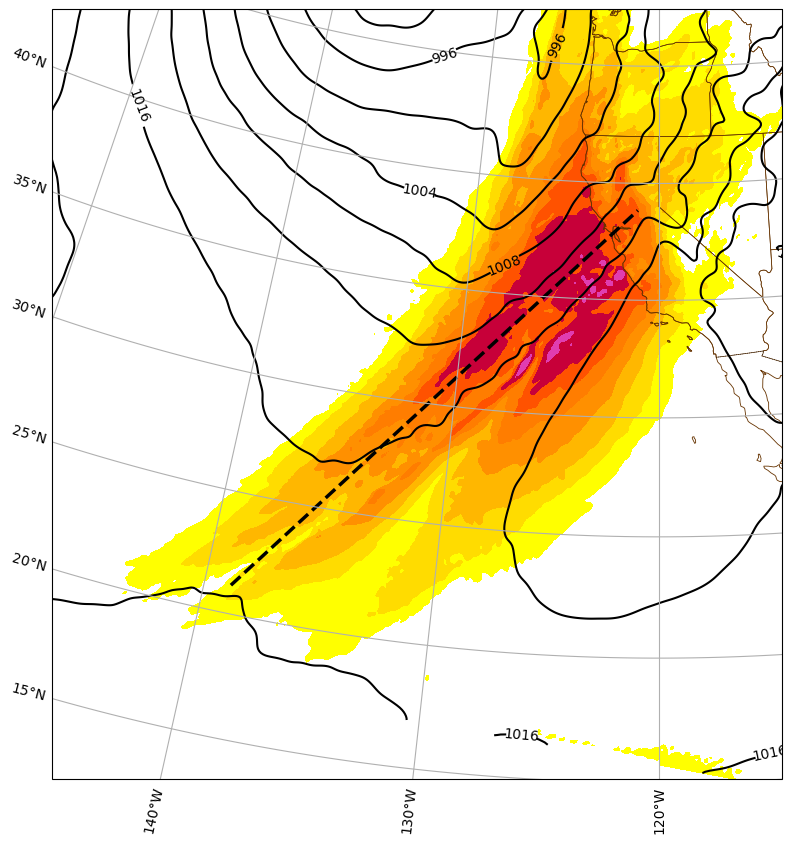

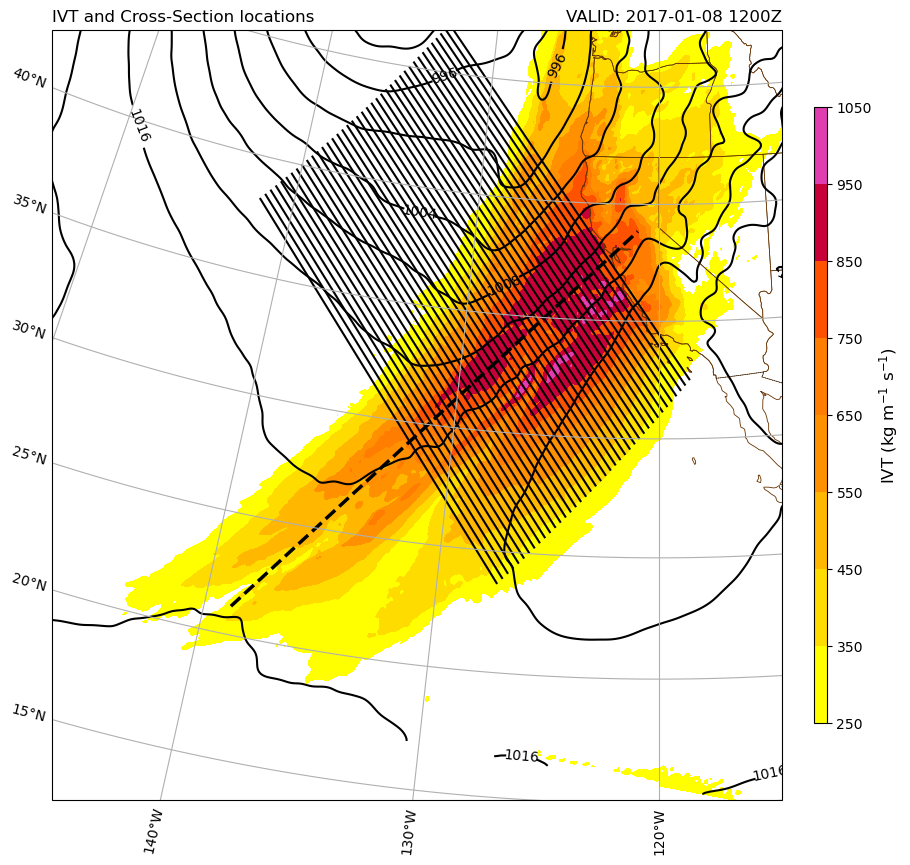

278.3168609619141


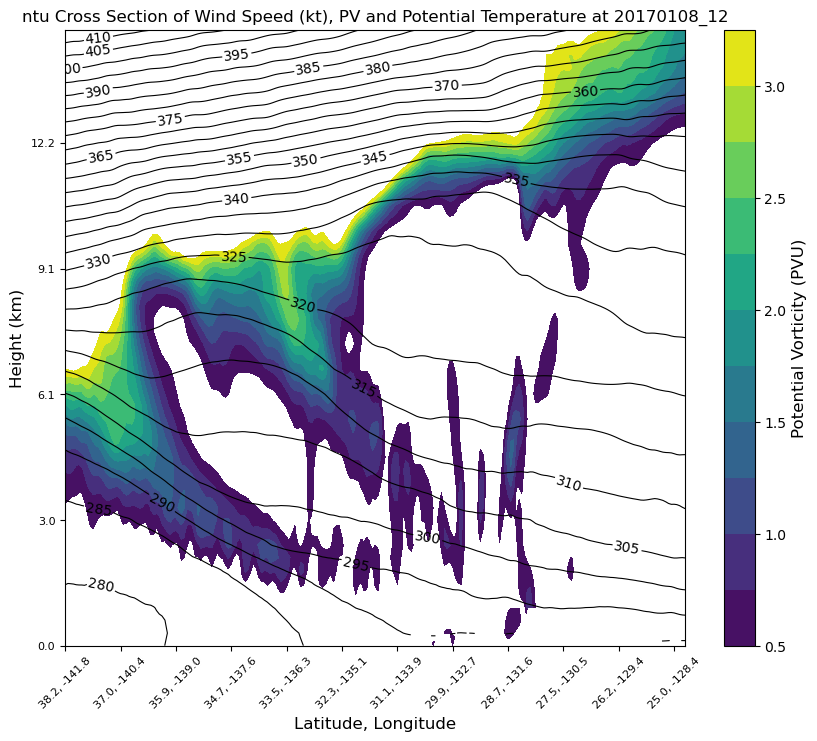

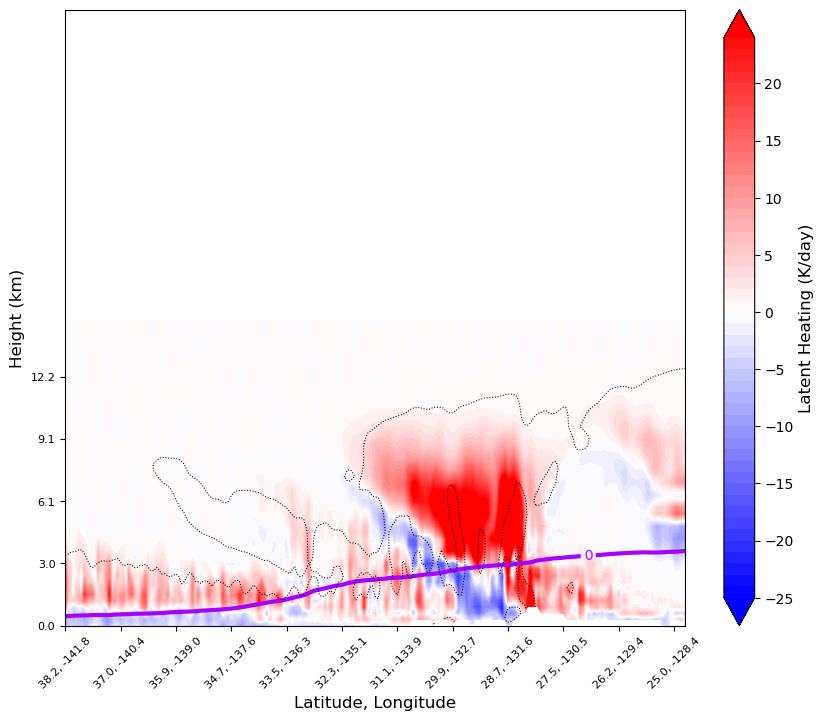

ensemble member:  wdm6
/scratch/sawyer/wwrf/2017-01-09/wdm6/wrfout_d01_2017-01-08_12:00:00


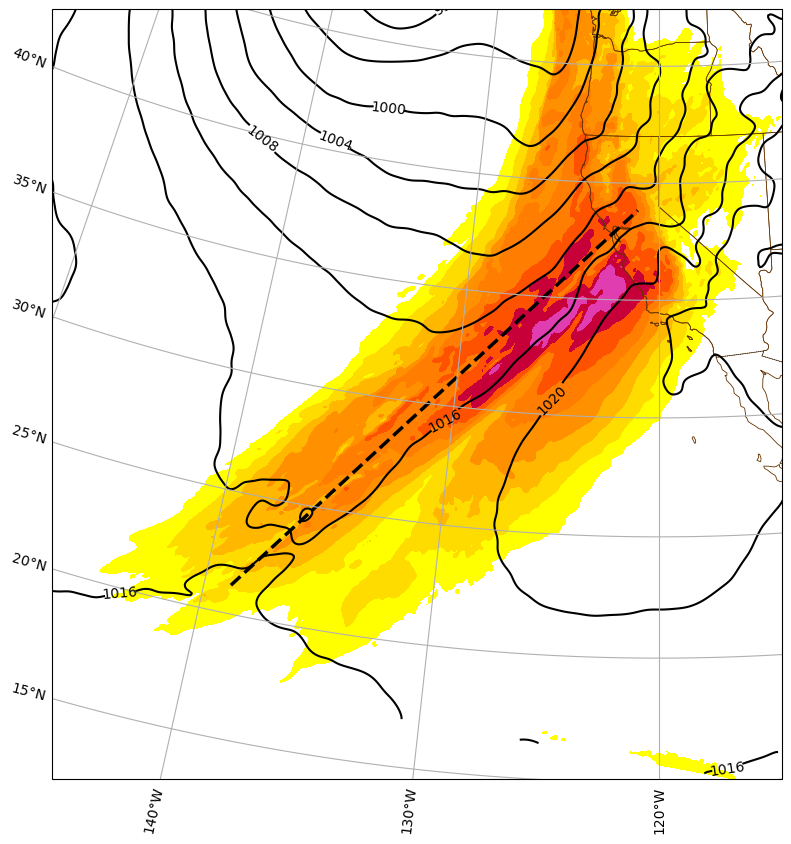

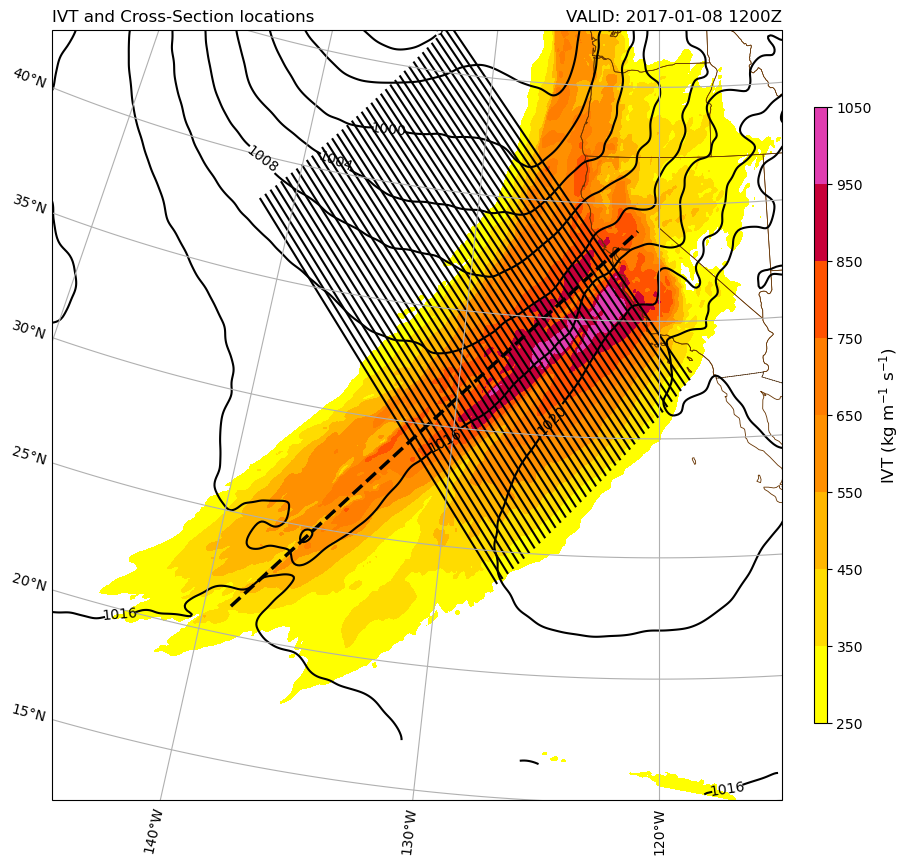

278.4005699157715


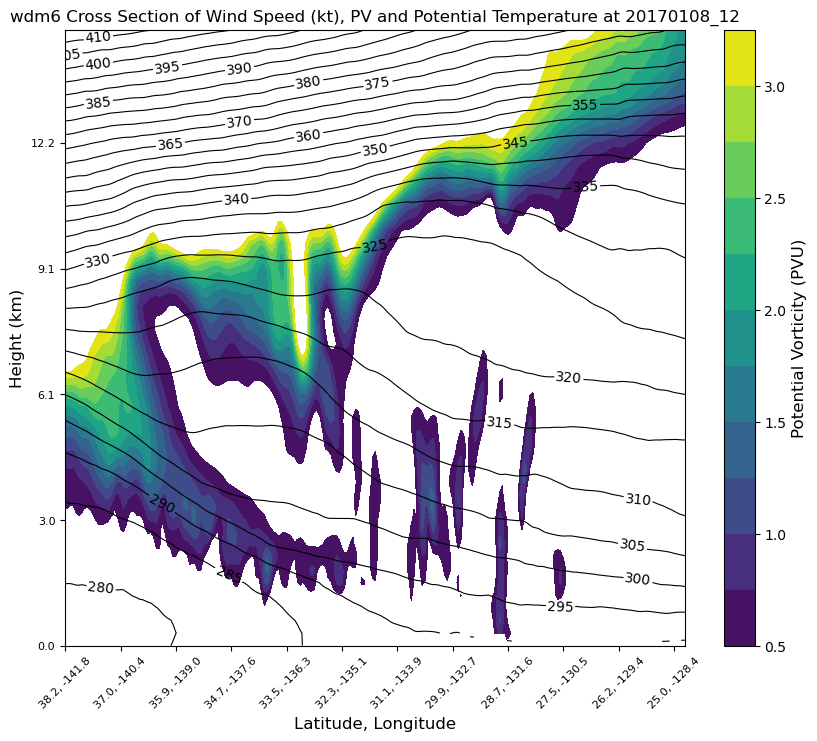

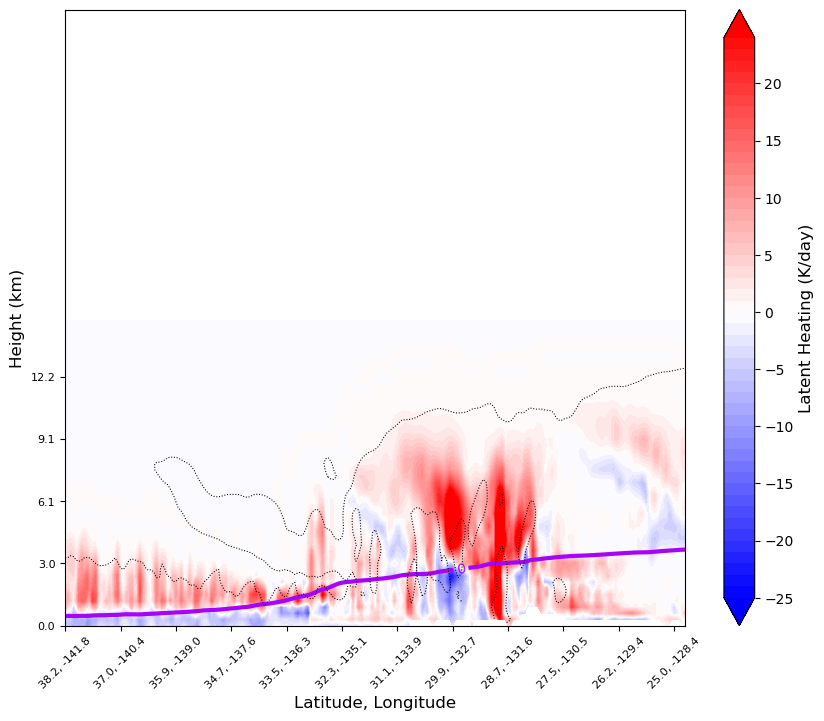

In [6]:
array_shape = []
# Loop through dictionary
for var_name, dir_path in directories.items():
    # First, filter the filenames that contain 'wrfout_d01' and then sort them
    sorted_files = sorted([filename for filename in os.listdir(dir_path) if domain in filename])
    #print(sorted_files)
    ensemble_member = var_name
    print("ensemble member: ", var_name)
    
    for filename in sorted_files:
        # Extract date-time from filename
        date_time_str = filename.split('_')[2] + ' ' + filename.split('_')[3]
        #print(date_time_str)# Adjust indices if filename structure is different
        current_datetime = datetime.strptime(date_time_str, "%Y-%m-%d %H:%M:%S")
        #print(current_datetime)# Check if the current_datetime is within bounds
        if start_bound <= current_datetime <= end_bound:
            file_path = os.path.join(dir_path, filename)
            print(file_path)
            
            with Dataset(file_path, 'r') as ncfile:

                Time=wrf.extract_times(ncfile, timeidx=0, method='cat', squeeze=True, cache=None, meta=False, do_xtime=False)
                timestr=(str(Time))

                # Set up one time string for plot titles, another for file names

                titletime=(timestr[0:10]+' '+timestr[11:13]+timestr[14:16])
                filetime=(timestr[0:10]+'_'+timestr[11:13])

                # Get all the variables we need
                z = getvar(ncfile, "z")
                p = getvar(ncfile, "pressure")*100
                inter_p = getvar(ncfile, "pressure")
                pvo = getvar(ncfile, "pvo")
                slp = getvar(ncfile, "slp")
                smooth_slp = gaussian_filter(slp, 3)
                #terrain = getvar(ncfile, "ter")
                t = getvar(ncfile, 'tc')
                #### Below is for cross section ########################
                pov = pvo
                #print(pov.shape)
                # Apply a Gaussian filter with a standard deviation of n pixels
                filtered_pv = gaussian_filter(pov, sigma=1)

                theta = getvar(ncfile, 'th')
                wdsp = getvar(ncfile,'uvmet_wspd', units='kts')
                #print(wdsp.shape)
                ph = getvar(ncfile, "PH") # get geopotential perturbation 
                phb = getvar(ncfile, "PHB") # get geopotential base state 
                geo_pot = ph + phb #Add base state and perturbation to get geopotential height
                geo_pot = (geo_pot / 9.8) / 1000 #Convert value to km
                z_notop = geo_pot[0:59,:,:]
                #print(z_notop.shape)
                h_diabatic = getvar(ncfile, 'H_DIABATIC')
                rthcuten = getvar(ncfile,'RTHCUTEN')
                lh =h_diabatic+rthcuten
                #filtered_wdsp = gaussian_filter(wdsp, sigma=2)
                #print(wdsp.shape)
                #w =  getvar(ncfile, 'W')
                #print(w.shape)
                #ice = getvar(data, 'QICE')
                #vapor = getvar(ncfile, 'QVAPOR')[0:35,:,:]*1000
                #print(vapor.max)
                #graup = getvar(data, 'QGRAUP')
                #snow = getvar(data, 'QSNOW')
                # Get the lat/lon coordinates
                lats, lons = latlon_coords(z)

                ## WWRF longitude fix ######
                new_lons =np.where(lons > 0, lons - 360, lons)

                #ua_kts = getvar(ncfile, "ua", units = "kt")
                #va_kts = getvar(ncfile, "va",units = "kt")
                ua = getvar(ncfile, "ua")
                va = getvar(ncfile, "va")
                wspd = getvar(ncfile, "wspd_wdir")[0,:]

                mixing_ratio = ncfile['QVAPOR'][0,:,:,:]

                uflux_l = []
                vflux_l = []

                for m in range(0,len(mixing_ratio)-2):
                    layer_diff = p[m,:,:]-p[m+1,:,:]
                    ql = (mixing_ratio[m+1,:,:]+mixing_ratio[m,:,:])/2
                    ul = (ua[m+1,:,:]+ua[m,:,:])/2
                    vl = (va[m+1,:,:]+va[m,:,:])/2
                    qfl = (ql/9.8)*layer_diff
                    uflux= ul * qfl
                    vflux = vl * qfl
                    uflux_l.append(uflux)
                    vflux_l.append(vflux)

                uflux_l=np.asarray(uflux_l)
                vflux_l=np.asarray(vflux_l)
                uIVT = np.sum(uflux_l, axis = 0)
                vIVT = np.sum(vflux_l, axis = 0)
                IVT_tot=np.sqrt(uIVT**2+vIVT**2)
                
                lon_mid = -130
                lat_mid = 30
                length = 25
                angle = 45
                axis = get_axis_coords((lon_mid,lat_mid),length,angle)
                #print(axis[0])
                #print(axis[2])
                x1, x2 = axis[0], axis[2]
                y1, y2 = axis[1], axis[3]
                
                # Take a quick look at our axis if plot_axis = True
                ########### what pressure level do we want to view with our plots, if any ###

                if plot_axis == True:
                    # Get the cartopy mapping object
                    lcc_projection = ccrs.LambertConformal(
                        central_longitude=-120.0)

                    fig, ax = plt.subplots(figsize=(14,10), subplot_kw={'projection': lcc_projection})
                    ax.set_extent([-145, -115, 15, 45])
                    ax.add_feature(cfeature.STATES.with_scale('50m'), linewidth=0.5, edgecolor=dark_brown)
                    ax.coastlines('50m', linewidth=0.6, color=dark_brown)
                    ax.add_feature(cfeature.BORDERS.with_scale('50m'), linestyle=':', linewidth=0.5)#Add coastlines


                    cs = ax.contourf(to_np(new_lons), to_np(lats), to_np(IVT_tot), cmap = cmap, levels = ivt_levels, transform=ccrs.PlateCarree())
                    cp = ax.contour(to_np(new_lons), to_np(lats), to_np(smooth_slp), colors='black', levels = pmsl_levels, transform=ccrs.PlateCarree())
                    ax.clabel(cp, fmt='%1.0f', inline=True,levels=pmsl_levels)
                    ax.plot([axis[0], axis[2]], [axis[1],axis[3]], color = 'black', linewidth=2.5,linestyle='--', transform=ccrs.PlateCarree())
                    gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
                    gl.top_labels=False   # suppress top grid labels
                    gl.right_labels=False # suppress right grid labels
                    plt.show()
                    
            # Calculate the slope of the original line
                slope = (y2 - y1) / (x2 - x1)

                # Calculate the negative reciprocal (perpendicular slope)
                perp_slope = -1 / slope if slope != 0 else float('inf')  # Check for vertical line

                # Use np.linspace to calculate midpoints
                # make adjustments to midpoint slider below; (e.g. to slide further northeast, slider would corresponde to values > 0.5
                # 0.5 is midpoint of axis
                slider = 0.49
                width = 0.017
                num = 40
                midpoints_x = np.linspace((x1 + x2) * (slider - width), (x1 + x2) * (slider + width), num=num)

                # Define the length of each perpendicular line from its midpoint
                southern_perp_line_length = 4.5
                northern_perp_line_length = 10.
                # Prepare a list to store the endpoints of each perpendicular line
                perpendicular_line_endpoints = []
                # Iterate through the calculated midpoints
                for mid_x in midpoints_x:
                    mid_y = (mid_x - x1) * slope + y1  # Calculate corresponding mid_y based on the original line's slope

                    # Define the x-range for the perpendicular line to ensure it's within the grid
                    if perp_slope != float('inf'):  # Regular case, not a vertical line
                        x_range = np.linspace(mid_x - northern_perp_line_length, mid_x + southern_perp_line_length, 2)
                        # Define the perpendicular line's y-coordinates based on the perpendicular slope
                        y_perp = perp_slope * (x_range - mid_x) + mid_y
                    else:  # Special case for a vertical line
                        x_range = [mid_x, mid_x]
                        y_perp = [mid_y - perp_line_length, mid_y + perp_line_length]

                    # Store the start and end points of the perpendicular line
                    start_point = (x_range[0], y_perp[0])
                    end_point = (x_range[1], y_perp[1])
                    perpendicular_line_endpoints.append((start_point, end_point))

                # Now you have the start and end points of each perpendicular line stored
                # The following lines will print them
                #print(perpendicular_line_endpoints)
                #for line in perpendicular_line_endpoints:
                    #print(f"Perpendicular line start point: {line[0]}, end point: {line[1]}")
                
                if plot_cs == True:
                    """
                    Plot AR IVT to get an idea of horizontal placement, and overlay the coordinates of our cross section.
                    """
                    # Get the cartopy mapping object
                    lcc_projection = ccrs.LambertConformal(
                        central_longitude=-120.0)

                    fig, ax = plt.subplots(figsize=(14,10), subplot_kw={'projection': lcc_projection})
                    ax.set_extent([-145, -115, 15, 45])
                    ax.add_feature(cfeature.STATES.with_scale('50m'), linewidth=0.5, edgecolor=dark_brown)
                    ax.coastlines('50m', linewidth=0.6, color=dark_brown)
                    ax.add_feature(cfeature.BORDERS.with_scale('50m'), linestyle=':', linewidth=0.5)#Add coastlines


                    cs = ax.contourf(to_np(new_lons), to_np(lats), to_np(IVT_tot), cmap = cmap, levels = ivt_levels, transform=ccrs.PlateCarree())
                    cp = ax.contour(to_np(new_lons), to_np(lats), to_np(smooth_slp), colors='black', levels = pmsl_levels, transform=ccrs.PlateCarree())
                    ax.clabel(cp, fmt='%1.0f', inline=True,levels=pmsl_levels)
                    ax.plot([x1, x2], [y1,y2], color = 'black', linewidth=2.5,linestyle='--', transform=ccrs.PlateCarree())
                    #ax.plot(x_range, y_perp, label='Perpendicular Line',color = 'black', transform=ccrs.PlateCarree())
                    #ax.plot([x_range[0],x_range[-1]], [y_perp[0],y_perp[-1]], label='Perpendicular Line',color = 'black', transform=ccrs.PlateCarree())
                    # Plot each perpendicular line
                    for start_point, end_point in perpendicular_line_endpoints:
                        ax.plot([start_point[0], end_point[0]], [start_point[1], end_point[1]], color='black', transform=ccrs.PlateCarree())

                    cbar = plt.colorbar(cs, ax=ax, orientation="vertical", pad=.03, shrink=.8, aspect=50)
                    cbar.set_label("IVT (kg m$^{-1}$ s$^{-1}$)", fontsize = 12)

                    gl = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
                    gl.top_labels=False   # suppress top grid labels
                    gl.right_labels=False # suppress right grid labels
                    # Titles
                    plt.title('IVT and Cross-Section locations ',loc='left')
                    plt.title(f'VALID: {titletime}Z', loc='right')
                    plt.show()
                
                for start_point, end_point in perpendicular_line_endpoints:
    
                    # Assuming lat1 and lat2 are constants that you've defined elsewhere
                    start_point_coords = CoordPair(lat=start_point[1], lon=start_point[0]) # Start point
                    end_point_coords = CoordPair(lat=end_point[1], lon=end_point[0]) # End point

                    wdspp_cross = vertcross(wdsp, z_notop, wrfin=ncfile, start_point=start_point_coords,
                                           end_point=end_point_coords, latlon=True, meta=True)

                    #print("wind speed array shape: ",wdsp.shape)
                    shape = wdspp_cross.shape[1] # 
                    #print('shape: ', shape)
                    first_shape = wdspp_cross.shape[0] 
                    array_shape.append(shape) # Add the number of data points to the list
                    #print("wdsp cross array shape: ",wdsp_cross.shape)
                    # Let's assume you have a list of arrays: arrays_list
                     # Find the most common number of data points
                     # Print the most common value
                    # Determine the target size for the second dimension
                    # For example, using the average size
                min_size = np.min(array_shape)
                    #print(min_size)
                
                first_shape =100
                thet = np.zeros([first_shape,min_size])
                pv = np.zeros([first_shape,min_size])
                wind = np.zeros([first_shape,min_size])
                heat = np.zeros([first_shape,min_size])
                hgt= np.zeros([min_size])
                temp = np.zeros([first_shape,min_size])
                #print(wind.shape)


                top_lon = []
                bott_lon = []
                top_lat = []
                bott_lat = []
                new_num = len(top_lon)

                for strt_point, ed_point in perpendicular_line_endpoints:
                    # Assuming lat1 and lat2 are constants that you've defined elsewhere
                    start_point = CoordPair(lat=strt_point[1], lon=strt_point[0]) # Start point
                    end_point= CoordPair(lat=ed_point[1], lon=ed_point[0]) # End point

                    #print(start_point, end_point)

                    wdsp_cross = vertcross(wdsp, z_notop, wrfin=ncfile, start_point=start_point,
                                           end_point=end_point, latlon=True, meta=True)
                    #print(wdsp_cross.shape)

                    pv_cross = vertcross(pov, z_notop, wrfin=ncfile, start_point=start_point,
                                       end_point=end_point, latlon=True, meta=True)

 

                    th_cross = vertcross(theta, z_notop, wrfin=ncfile, start_point=start_point,
                                     end_point=end_point, latlon=True, meta=True)

                    h_cross = vertcross(lh, z_notop, wrfin=ncfile, start_point=start_point,
                                   end_point=end_point, latlon=True, meta=True)

                    t_cross = vertcross(t, z_notop, wrfin=ncfile, start_point=start_point,
                                       end_point=end_point, latlon=True, meta=True)

                        # Trim the arrays if their second dimension is greater than min_size
                    if wdsp_cross.shape[1] > min_size:
                        wdsp_cross = wdsp_cross[:, :min_size]
                    if pv_cross.shape[1] > min_size:
                        pv_cross = pv_cross[:, :min_size]
                    if th_cross.shape[1] > min_size:
                        th_cross = th_cross[:, :min_size]
                    if h_cross.shape[1] > min_size:
                        h_cross = h_cross[:, :min_size]

                    if t_cross.shape[1] > min_size:
                        t_cross = t_cross[:, :min_size]

                    wind += wdsp_cross.values
                    pv += pv_cross.values
                    thet += th_cross.values
                    heat += h_cross.values
                    temp += t_cross.values

                    top_lat.append(strt_point[1])
                    top_lon.append(strt_point[0])
                    bott_lon.append(ed_point[0])
                    bott_lat.append(ed_point[1])
                    
                
                theta_avg = thet / num
                #theta_avg = gaussian_filter(theta_avg, sigma=1)
                pv_avg = pv / num
                #pv_avg = gaussian_filter(pv_avg, sigma=1)
                wind_avg = wind / num
                diabatic_h = heat / num
                t_avg = hgt/num
                temp_avg = temp / num
                print(np.nanmin(theta_avg))
                lh_save_directory = "/scratch/sawyer/wwrf/2017-01-09/cross_sections/h_diab_vert"
                pv_save_directory = "/scratch/sawyer/wwrf/2017-01-09/cross_sections/pv_vert/"
                save_directory="/scratch/sawyer/wwrf/2017-01-09/cross_sections/theta_vert/"
                temp_save_directory="/scratch/sawyer/wwrf/2017-01-09/cross_sections/temp/"

                lh_name = f"total_lh_{ensemble_member}_{current_datetime.strftime('%Y%m%d_%H')}.npy"
                # Use the specified save directory for the numpy files
                lh_save_path = os.path.join(lh_save_directory, lh_name)

                pv_name = f"total_pv_{ensemble_member}_{current_datetime.strftime('%Y%m%d_%H')}.npy"
                # Use the specified save directory for the numpy files
                pv_save_path = os.path.join(pv_save_directory, pv_name)

                temp_name = f"temp_{ensemble_member}_{current_datetime.strftime('%Y%m%d_%H')}.npy"
                # Use the specified save directory for the numpy files
                temp_save_path = os.path.join(temp_save_directory, temp_name)

                theta_name = f"total_theta_{ensemble_member}_{current_datetime.strftime('%Y%m%d_%H')}.npy"
                # Use the specified save directory for the numpy files
                save_path = os.path.join(save_directory, theta_name)

                np.save(save_path, theta_avg)
                np.save(lh_save_path, diabatic_h)
                np.save(pv_save_path, pv_avg)
                np.save(temp_save_path, temp_avg)
        
                ############ Plot PV Cross section and save vert_vals and Coord_pairs for 10 panels ######################
            
                fig = plt.figure(figsize=(10,8))
                ax = plt.axes()
                wdsp_lvls = np.arange(20,120,10)
                #mixlvls = np.arange(0,12, 2)
                th_lvls = np.arange(280, 450, 5)
                #pv_lvls = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
                pv_lvls = np.arange(0.5,3.5,0.25)
                # Contours -- make sure to modify levels here
                #wdsp_contours = ax.contour(to_np(wind_avg), levels = wdsp_lvls, linewidths=.8, colors = 'red')
                #ax.clabel(wdsp_contours, fmt='%1.f')

                th_contours = ax.contour(to_np(theta_avg[:50,:]), levels = th_lvls, colors = 'black', linestyles='-',linewidths=.8)
                ax.clabel(th_contours, fmt='%1.f')


                pv_cont = ax.contourf(to_np(pv_avg[:50,:]), levels = pv_lvls, cmap='viridis')
                #hgt_cont = ax.contourf(to_np(t_avg), cmap='terrain')
                #ax.clabel(pv_cont, fmt='%1.1f')

                #cax = fig.add_axes([ax.get_position().x1+0.05,ax.get_position().y0,0.02,ax.get_position().height])  #You can change the numbers to move the colorbar.
                cbar = plt.colorbar(pv_cont) #cax = cax)
                cbar.set_label("Potential Vorticity (PVU)", fontsize = 12)

                # Set the x-ticks to use latitude and longitude labels.
                coord_pairs = to_np(wdsp_cross.coords["xy_loc"])
                x_ticks = np.arange(coord_pairs.shape[0])
                x_labels = [pair.latlon_str(fmt="{:.1f}, {:.1f}")
                            for pair in to_np(coord_pairs)]
                ax.set_xticks(x_ticks[::20])
                ax.set_xticklabels(x_labels[::20], rotation=45, fontsize=8)


                # Set the y-ticks to be height.
                vert_vals = to_np(wdsp_cross.coords["vertical"])
                vert_values = np.round(vert_vals, 1)
                start_idx = 50#len(vert_vals) // 2
                #print(start_idx)
                if not saved_once:
                    coord_pairs_save_directory = "/scratch/sawyer/wwrf/2017-01-09/cross_sections/coord_pairs/"
                    vert_vals_save_directory = "/scratch/sawyer/wwrf/2017-01-09/cross_sections/vert_vals/"
      

                    vv_name = f"vert_vals_{current_datetime.strftime('%Y%m%d_%H')}.npy"
                    cp_name = f"coord_pairs_{current_datetime.strftime('%Y%m%d_%H')}.npy"

                    cp_save_path = os.path.join(coord_pairs_save_directory, cp_name)
                    vv_save_path = os.path.join(vert_vals_save_directory, vv_name)

                    np.save(cp_save_path, coord_pairs)
                    np.save(vv_save_path, vert_vals)

                    saved_once = True

                # Update vert_vals to include only the top half
                vert_vals_half = vert_vals[:start_idx]

                # Set the y-ticks to be the top half of the height values
                v_ticks_half = np.arange(len(vert_vals_half))
                ax.set_yticks(v_ticks_half[::10])
                ax.set_yticklabels(np.round(vert_vals_half, 1)[::10], fontsize=8)

                #plt.gca().ticklabel_format(axis='both', style='plain', useOffset=False)

                # Set the x-axis and  y-axis labels
                ax.set_xlabel("Latitude, Longitude", fontsize=12)
                ax.set_ylabel("Height (km)", fontsize=12)

                plt.title(f"{ensemble_member} Cross Section of Wind Speed (kt), PV and Potential Temperature at {current_datetime.strftime('%Y%m%d_%H')}")

                plt.show()
                    
                if plot_lh == True:
                    ########### Diabatic heating Cross-Section average ############

                    fig = plt.figure(figsize=(10,8))
                    ax = plt.axes()
                    l4 = ax.contour(to_np(temp_avg), colors = ('#a503fc',), levels = np.arange(0,1, 1), linewidths = 3)
                    # Calculate the maximum absolute difference to determine the color bar limits
                    max_diff = np.abs(h_cross*86400).max()

                    # Set the color bar limits symmetrically around zero

                    vmin, vmax, vcenter = -25, 25, 0

                    # Create a TwoSlopeNorm. This norm allows us to have a different color
                    # intensity rate below and above the center.
                    norm = TwoSlopeNorm(vmin=vmin, vcenter=vcenter, vmax=vmax)
                    ax.clabel(l4)
                    cs = ax.contourf(to_np(diabatic_h[:50,:]*86400), cmap = 'bwr',extend='both', norm=norm, levels = np.arange(-25, 25, 1))
                    pv_cont = ax.contour(to_np(pv_avg[:50,:]), levels = [.5], colors='black',linewidths = 0.75,linestyles=':')
                    #pv_contf = ax.contourf(to_np(pv_avg[:50,:]), levels = [.5,1,1.5,2,2.5,3,3.5,4,4.5,5.,5.5,6.0,6.5], alpha=0.5,cmap='Greys_r',linewidths = 0.75,linestyles=':')
                    cbar = plt.colorbar(cs) 
                    cbar.set_label("Latent Heating (K/day)", fontsize = 12)

                    # Set the x-ticks to use latitude and longitude labels.
                    coord_pairs = to_np(th_cross.coords["xy_loc"])
                    x_ticks = np.arange(coord_pairs.shape[0])
                    x_labels = [pair.latlon_str(fmt="{:.1f}, {:.1f}")
                                for pair in to_np(coord_pairs)]
                    ax.set_xticks(x_ticks[::20])
                    ax.set_xticklabels(x_labels[::20], rotation=45, fontsize=8)

                    # Set the y-ticks to be height.
                    vert_vals = to_np(th_cross.coords["vertical"])
                    vert_values = np.round(vert_vals, 1)
                    start_idx = 50#len(vert_vals) // 2
                    #print(start_idx)

                    # Update vert_vals to include only the top half
                    vert_vals_half = vert_vals[:start_idx]

                    # Set the y-ticks to be the top half of the height values
                    v_ticks_half = np.arange(len(vert_vals_half))
                    ax.set_yticks(v_ticks_half[::10])
                    ax.set_yticklabels(np.round(vert_vals_half, 1)[::10], fontsize=8)

                    # Set the x-axis and  y-axis labels
                    ax.set_xlabel("Latitude, Longitude", fontsize=12)
                    ax.set_ylabel("Height (km)", fontsize=12)

                    #plt.gca().ticklabel_format(axis='both', style='plain', useOffset=False)

                    # Set the x-axis and  y-axis labels
                    ax.set_xlabel("Latitude, Longitude", fontsize=12)
                    ax.set_ylabel("Height (km)", fontsize=12)


                    #plt.title(f"Vertical Cross Section of Latent Heating at {hour} UTC {day} Jan 2017")

                    plt.show()


             



50


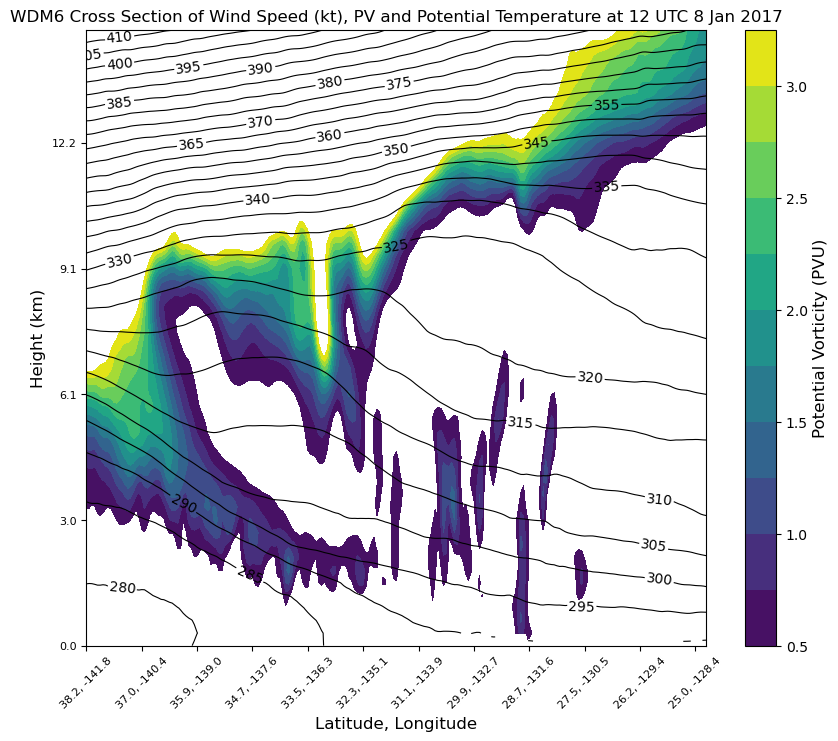

In [7]:
fig = plt.figure(figsize=(10,8))
ax = plt.axes()
wdsp_lvls = np.arange(20,120,10)
#mixlvls = np.arange(0,12, 2)
th_lvls = np.arange(280, 450, 5)
#pv_lvls = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
pv_lvls = np.arange(0.5,3.5,0.25)
# Contours -- make sure to modify levels here
#wdsp_contours = ax.contour(to_np(wind_avg), levels = wdsp_lvls, linewidths=.8, colors = 'red')
#ax.clabel(wdsp_contours, fmt='%1.f')

th_contours = ax.contour(to_np(theta_avg[:50,:]), levels = th_lvls, colors = 'black', linestyles='-',linewidths=.8)
ax.clabel(th_contours, fmt='%1.f')


pv_cont = ax.contourf(to_np(pv_avg[:50,:]), levels = pv_lvls, cmap='viridis')
#hgt_cont = ax.contourf(to_np(t_avg), cmap='terrain')
#ax.clabel(pv_cont, fmt='%1.1f')

#cax = fig.add_axes([ax.get_position().x1+0.05,ax.get_position().y0,0.02,ax.get_position().height])  #You can change the numbers to move the colorbar.
cbar = plt.colorbar(pv_cont) #cax = cax)
cbar.set_label("Potential Vorticity (PVU)", fontsize = 12)

# Set the x-ticks to use latitude and longitude labels.
coord_pairs = to_np(wdsp_cross.coords["xy_loc"])
x_ticks = np.arange(coord_pairs.shape[0])
x_labels = [pair.latlon_str(fmt="{:.1f}, {:.1f}")
            for pair in to_np(coord_pairs)]
ax.set_xticks(x_ticks[::20])
ax.set_xticklabels(x_labels[::20], rotation=45, fontsize=8)


# Set the y-ticks to be height.
vert_vals = to_np(wdsp_cross.coords["vertical"])
vert_values = np.round(vert_vals, 1)
start_idx = 50#len(vert_vals) // 2
print(start_idx)

# Update vert_vals to include only the top half
vert_vals_half = vert_vals[:start_idx]

# Set the y-ticks to be the top half of the height values
v_ticks_half = np.arange(len(vert_vals_half))
ax.set_yticks(v_ticks_half[::10])
ax.set_yticklabels(np.round(vert_vals_half, 1)[::10], fontsize=8)

#plt.gca().ticklabel_format(axis='both', style='plain', useOffset=False)

# Set the x-axis and  y-axis labels
ax.set_xlabel("Latitude, Longitude", fontsize=12)
ax.set_ylabel("Height (km)", fontsize=12)

plt.title("WDM6 Cross Section of Wind Speed (kt), PV and Potential Temperature at 12 UTC 8 Jan 2017")

plt.show()

In [8]:
lljet= wind_avg[0:30,:]

lljet.shape
lljet.max()

nan

50


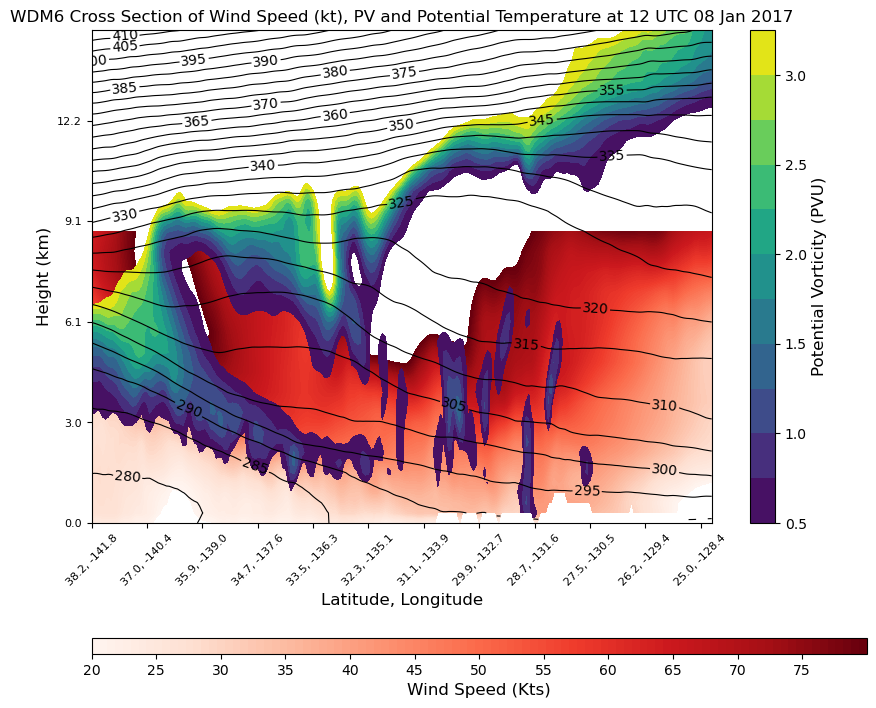

In [9]:
fig = plt.figure(figsize=(10,8))
ax = plt.axes()

llj = np.linspace(20,80.0,100)
pv_lvls = np.arange(0.5,3.35,0.25)
# Contours -- make sure to modify levels here

llj_contours = ax.contourf(to_np(lljet), levels = llj, cmap= get_cmap("Reds"), alpha=1)

# Create the colorbar
cb = plt.colorbar(llj_contours, orientation='horizontal', pad=0.05, aspect=50, shrink=0.5, ax=ax)
colorbar_labels = np.arange(20, 80, 5)  # 80 is used to ensure 75 is included in the array

# Set the tick labels for the colorbar
cb.set_ticks(colorbar_labels)
cb.set_ticklabels(colorbar_labels)
# Optional: Set the label for the colorbar
cb.set_label('Wind Speed (Kts)', fontsize=12)

# Move the colorbar to the bottom of the plot.
# The `pad` argument controls the distance from the bottom of the plot, adjust as needed.
cb.ax.set_position([ax.get_position().x0, 0.1, ax.get_position().width, 0.02])
#wdsp_contours = ax.contour(to_np(wind_avg), levels = wdsp_lvls, linewidths=.8, colors = 'red')
#ax.clabel(wdsp_contours, fmt='%1.f')

th_contours = ax.contour(to_np(theta_avg[:50,:]), levels = th_lvls, colors = 'black', linestyles='-',linewidths=.8)
ax.clabel(th_contours, fmt='%1.f')


pv_cont = ax.contourf(to_np(pv_avg[:50,:]), levels = pv_lvls, cmap='viridis')
#ax.clabel(pv_cont, fmt='%1.1f')

#cax = fig.add_axes([ax.get_position().x1+0.05,ax.get_position().y0,0.02,ax.get_position().height])  #You can change the numbers to move the colorbar.
cbar = plt.colorbar(pv_cont) #cax = cax)
cbar.set_label("Potential Vorticity (PVU)", fontsize = 12)

# Set the x-ticks to use latitude and longitude labels.
coord_pairs = to_np(th_cross.coords["xy_loc"])
x_ticks = np.arange(coord_pairs.shape[0])
x_labels = [pair.latlon_str(fmt="{:.1f}, {:.1f}")
            for pair in to_np(coord_pairs)]
ax.set_xticks(x_ticks[::20])
ax.set_xticklabels(x_labels[::20], rotation=45, fontsize=8)

# Set the y-ticks to be height.
vert_vals = to_np(wdsp_cross.coords["vertical"])
vert_values = np.round(vert_vals, 1)
start_idx = 50#len(vert_vals) // 2
print(start_idx)

# Update vert_vals to include only the top half
vert_vals_half = vert_vals[:start_idx]

# Set the y-ticks to be the top half of the height values
v_ticks_half = np.arange(len(vert_vals_half))
ax.set_yticks(v_ticks_half[::10])
ax.set_yticklabels(np.round(vert_vals_half, 1)[::10], fontsize=8)

# Set the x-axis and  y-axis labels
ax.set_xlabel("Latitude, Longitude", fontsize=12)
ax.set_ylabel("Height (km)", fontsize=12)

plt.title("WDM6 Cross Section of Wind Speed (kt), PV and Potential Temperature at 12 UTC 08 Jan 2017")

plt.show()